In [1]:
import sys
sys.path.append('/cluster/home/kjoanna/denoising_flows')

import matplotlib.pyplot as plt

import torch
import torch.optim as optim

from nflows.flows import MaskedAutoregressiveFlow

## Load stylegan data 

In [2]:
import os
import numpy as np
data_dir = '/cluster/project/scopem/kjoanna/datasets/celeba_sampled'

features = np.load(os.path.join(data_dir, 'downscaled.npy'))
#downscaled_reshaped = np.load(os.path.join(data_dir, 'downscaled_reshaped.npy'))
zs = np.load(os.path.join(data_dir, 'zs.npy'))
#ws_reshaped = np.load(os.path.join(data_dir, 'ws_reshaped.npy'))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


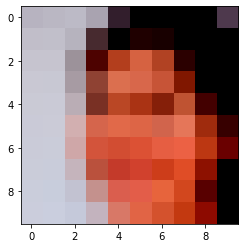

In [13]:
from matplotlib import pyplot as plt
plt.imshow(np.transpose(downscaled[2], [1, 2, 0]))

In [16]:
downscaled[2].shape

(3, 10, 10)

In [3]:
import numpy as np
import sys
sys.path.append('/cluster/home/kjoanna/StyleGAN2-TensorFlow-2.x')
from stylegan2_generator import StyleGan2Generator
from skimage.transform import resize
from tqdm import tqdm

seed = 12
rnd = np.random.RandomState(seed)
impl = 'cuda' # 'ref' if cuda is not available in your machine
gpu = True # False if tensorflow cpu is used
weights_name = 'ffhq' # face model trained by Nvidia


generator = StyleGan2Generator(weights=weights_name, impl=impl, gpu=gpu)



Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
Loaded ffhq generator weights!


In [4]:
from matplotlib import pyplot as plt
from skimage.transform import resize

w = generator.mapping_network(z_in, training=False)
out_image = generator.synthesis_network(w, training=False)

original_image = np.transpose(np.squeeze(out_image), [1,2,0])
resized_image = resize(original_image, [10, 10, 3])
plt.imshow(original_image)
plt.show()
plt.imshow(resized_image)
plt.show()
plt.imshow(features[0])

NameError: name 'z_in' is not defined

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


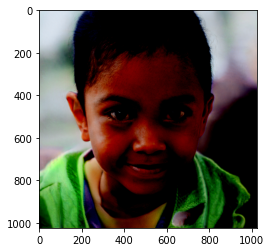

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


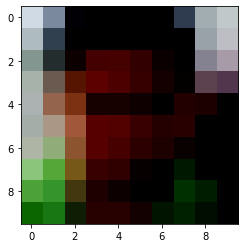

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


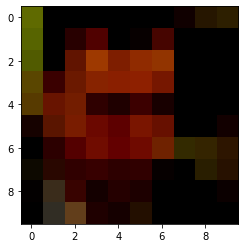

In [31]:
plt.imshow(original_image)
plt.show()
plt.imshow(resized_image)
plt.show()
plt.imshow(np.transpose(np.reshape(features[0], [3, 10,10]), [1,2,0]))

In [10]:
import sys
sys.path.append('/cluster/home/kjoanna/denoising_flows')

import matplotlib.pyplot as plt
import sklearn.datasets as datasets

import torch
import torch.optim as optim

from nflows.flows import MaskedAutoregressiveFlow

flow = MaskedAutoregressiveFlow(features=512, hidden_features=512, context_features=300)
optimizer = optim.Adam(flow.parameters(), lr=0.0005)

In [11]:
#x = zs
features = np.reshape(features, [10000, -1])

In [12]:
from torch.utils.data import Dataset

class StyleganDataset(Dataset):
    def __init__(self, xs, ys):
        self.xs = xs
        self.ys = ys

    def __len__(self):
        return self.xs.shape[0]

    def __getitem__(self, idx):
        x = self.xs[idx]
        y = self.ys[idx]
        return x, y
    
dataset = StyleganDataset(zs, features)


In [13]:
from torch.utils.data import DataLoader

train_loader = DataLoader(dataset=dataset, batch_size=64, shuffle=True)

  0%|          | 0/100 [00:00<?, ?it/s]

loss is tensor(752.8434, grad_fn=<NegBackward>)
tensor([[-861.3476, -837.4003, -791.1483]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


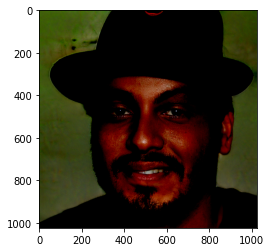

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


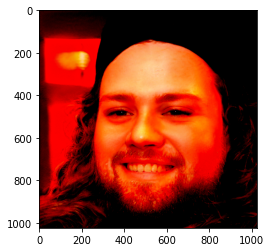

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


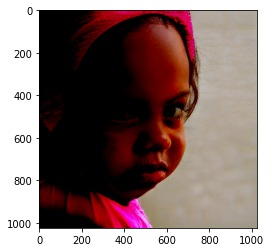

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


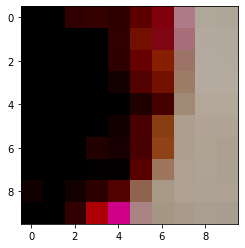

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


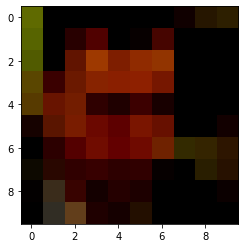

  1%|          | 1/100 [00:46<1:15:57, 46.03s/it]

loss is tensor(735.7059, grad_fn=<NegBackward>)
tensor([[-776.3199, -807.2020, -799.7648]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


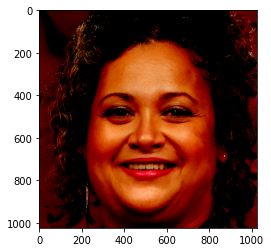

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


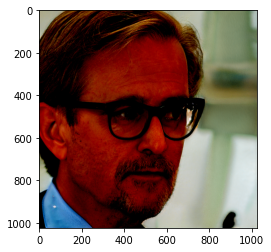

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


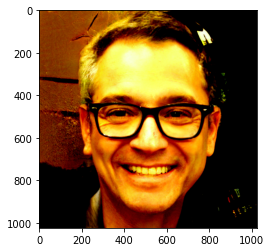

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


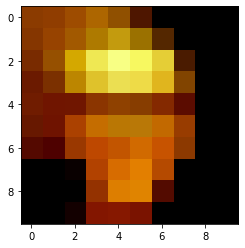

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


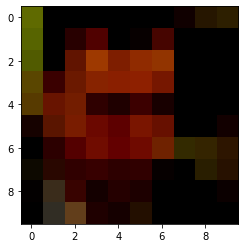

  2%|▏         | 2/100 [01:30<1:14:33, 45.65s/it]

loss is tensor(730.8645, grad_fn=<NegBackward>)
tensor([[-728.1721, -736.7679, -741.2067]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


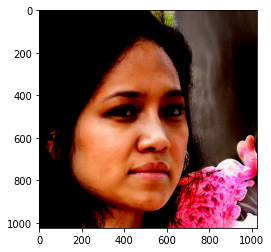

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


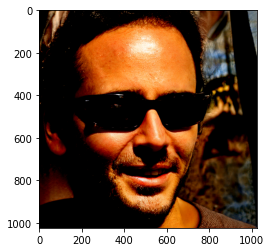

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


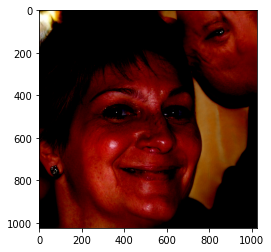

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


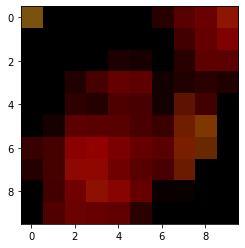

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


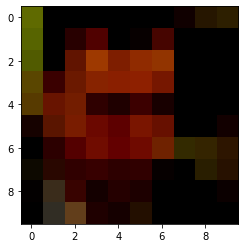

  3%|▎         | 3/100 [02:15<1:13:14, 45.31s/it]

loss is tensor(724.1478, grad_fn=<NegBackward>)
tensor([[-749.7939, -728.0720, -745.4639]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


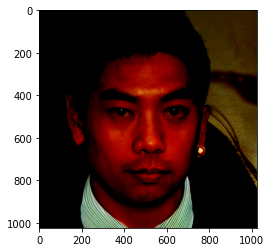

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


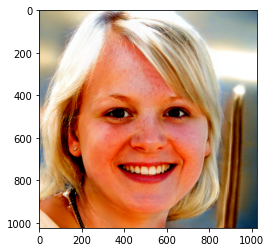

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


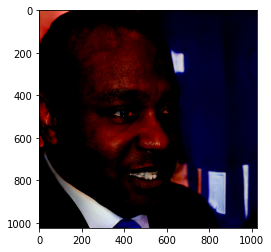

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


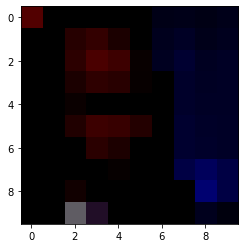

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


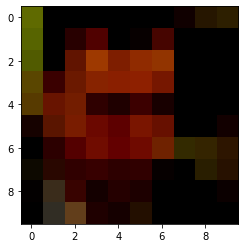

  4%|▍         | 4/100 [03:00<1:12:16, 45.17s/it]

loss is tensor(729.5936, grad_fn=<NegBackward>)
tensor([[-707.6461, -748.0512, -771.0490]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


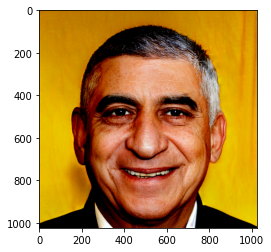

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


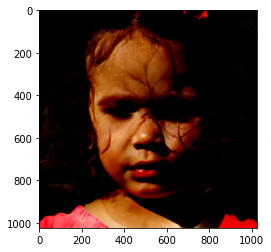

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


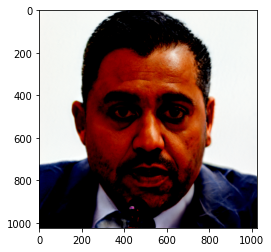

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


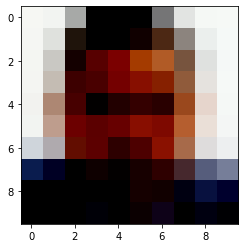

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


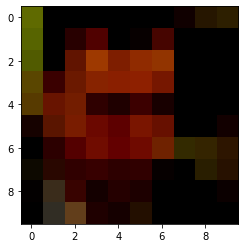

  5%|▌         | 5/100 [03:44<1:11:07, 44.93s/it]

loss is tensor(713.8132, grad_fn=<NegBackward>)
tensor([[-761.4465, -757.4564, -772.1422]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


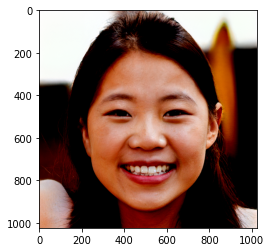

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


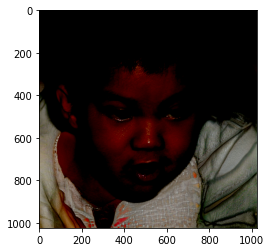

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


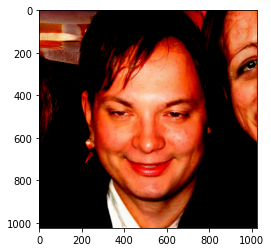

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


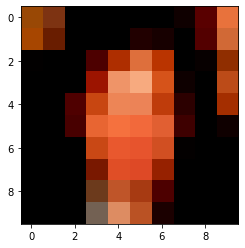

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


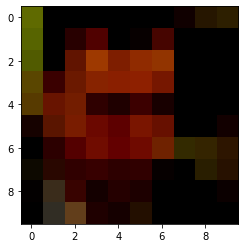

  6%|▌         | 6/100 [04:29<1:10:23, 44.93s/it]

loss is tensor(725.2075, grad_fn=<NegBackward>)
tensor([[-731.9319, -723.7597, -739.2683]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


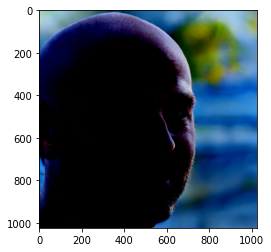

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


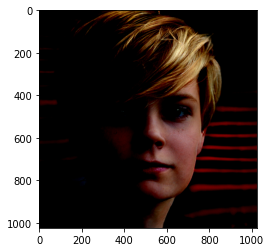

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


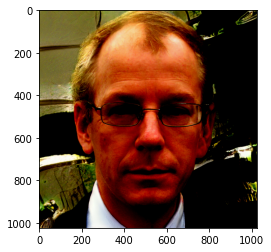

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


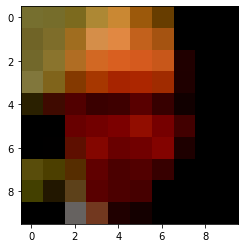

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


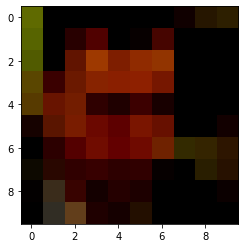

  7%|▋         | 7/100 [05:12<1:08:53, 44.45s/it]

loss is tensor(719.9758, grad_fn=<NegBackward>)
tensor([[-738.0148, -698.8839, -707.4559]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


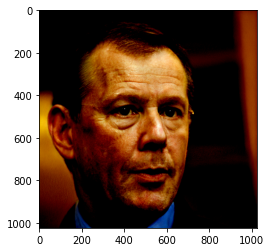

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


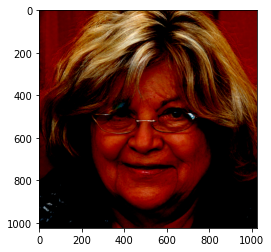

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


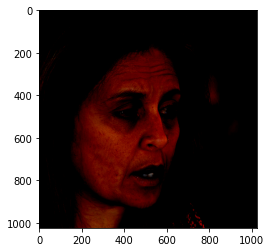

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


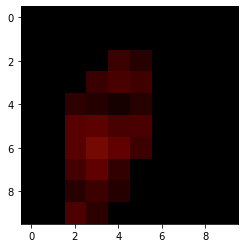

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


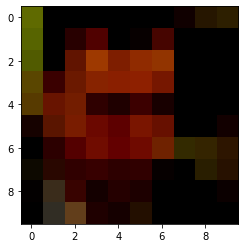

  8%|▊         | 8/100 [05:58<1:08:34, 44.72s/it]

loss is tensor(723.9525, grad_fn=<NegBackward>)
tensor([[-728.3472, -723.1684, -744.9199]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


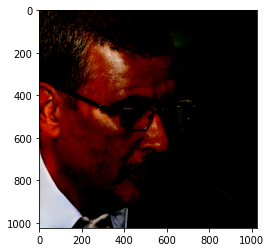

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


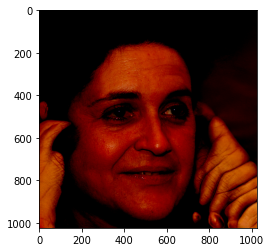

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


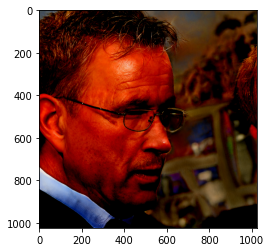

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


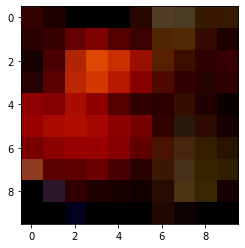

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


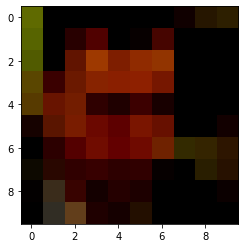

  9%|▉         | 9/100 [06:42<1:07:43, 44.65s/it]

loss is tensor(714.3855, grad_fn=<NegBackward>)
tensor([[-717.1544, -748.8898, -735.5800]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


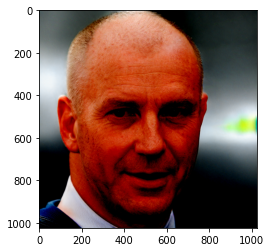

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


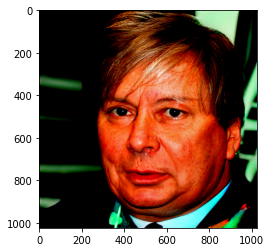

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


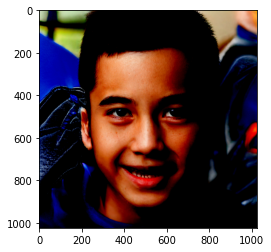

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


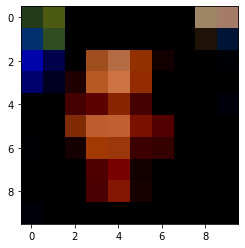

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


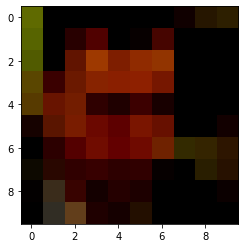

 10%|█         | 10/100 [07:27<1:07:00, 44.67s/it]

loss is tensor(707.3860, grad_fn=<NegBackward>)
tensor([[-722.4798, -721.9454, -745.3082]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


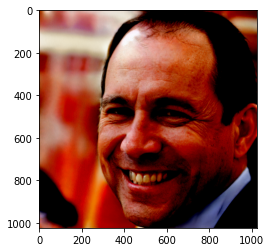

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


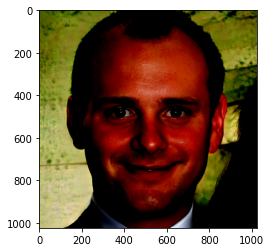

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


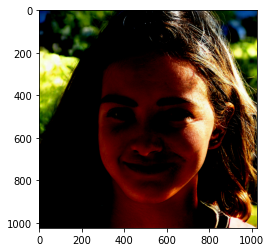

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


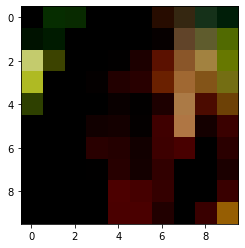

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


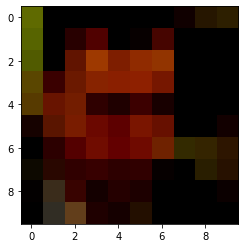

 11%|█         | 11/100 [08:11<1:05:59, 44.49s/it]

loss is tensor(712.8639, grad_fn=<NegBackward>)
tensor([[-714.9797, -736.9078, -746.9607]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


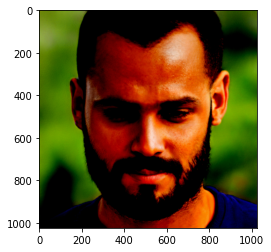

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


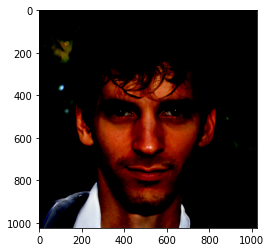

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


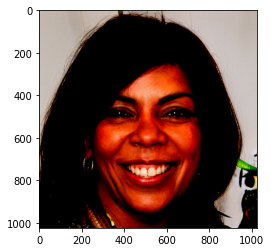

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


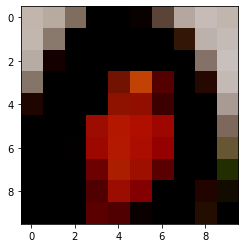

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


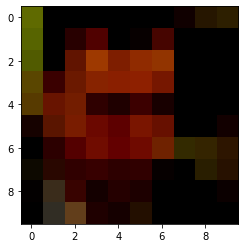

 12%|█▏        | 12/100 [08:56<1:05:41, 44.79s/it]

loss is tensor(705.0353, grad_fn=<NegBackward>)
tensor([[-701.2303, -695.3956, -749.5544]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


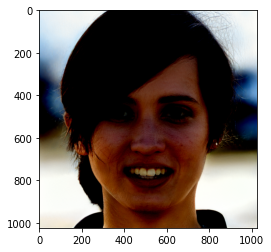

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


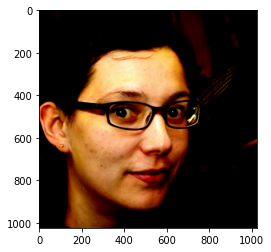

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


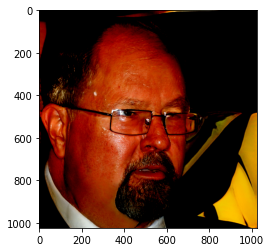

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


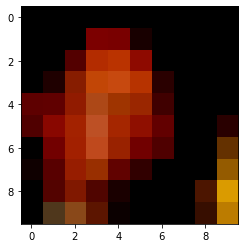

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


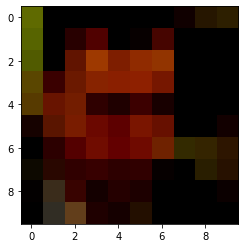

 13%|█▎        | 13/100 [09:41<1:04:50, 44.72s/it]

loss is tensor(706.9658, grad_fn=<NegBackward>)
tensor([[-689.1328, -709.3569, -749.0823]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


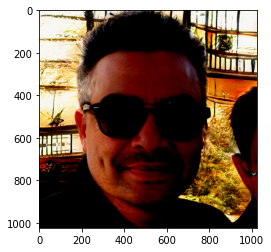

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


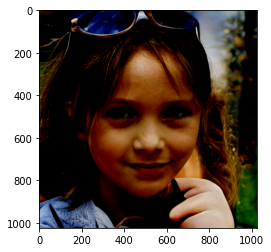

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


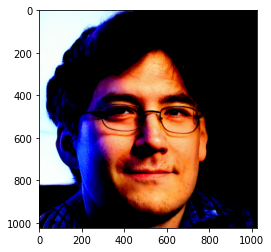

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


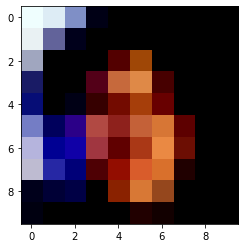

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


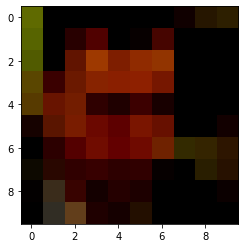

 14%|█▍        | 14/100 [10:26<1:04:06, 44.73s/it]

loss is tensor(698.3774, grad_fn=<NegBackward>)
tensor([[-700.2888, -689.6043, -708.8472]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


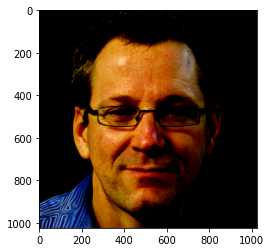

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


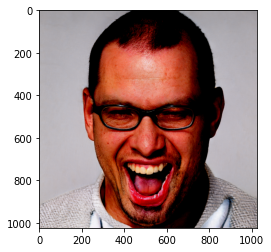

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


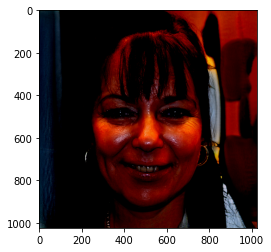

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


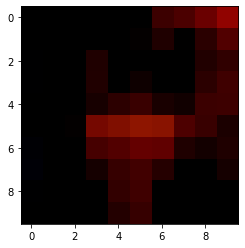

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


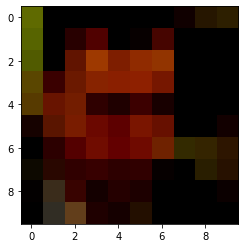

 15%|█▌        | 15/100 [11:10<1:03:20, 44.72s/it]

loss is tensor(697.2900, grad_fn=<NegBackward>)
tensor([[-672.6177, -744.5704, -724.7206]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


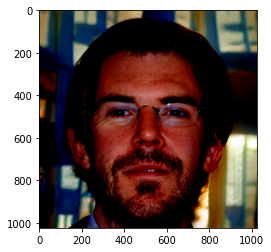

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


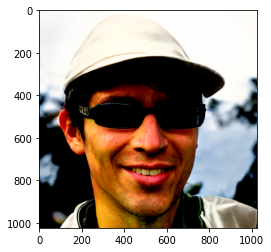

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


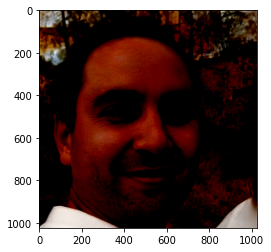

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


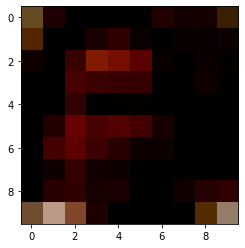

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


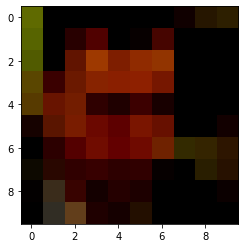

 16%|█▌        | 16/100 [11:56<1:02:50, 44.89s/it]

loss is tensor(693.5760, grad_fn=<NegBackward>)
tensor([[-687.2012, -718.7663, -721.9282]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


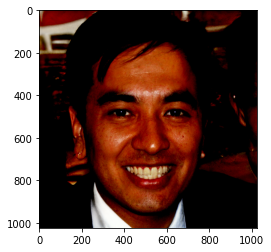

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


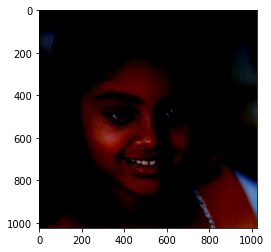

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


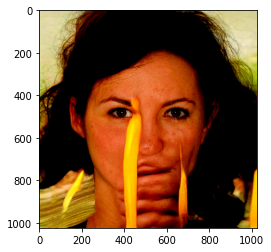

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


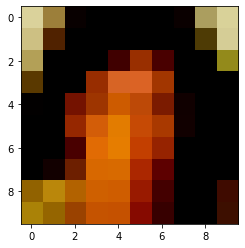

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


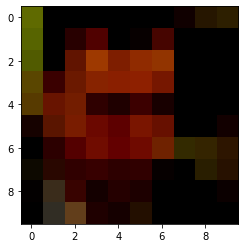

 17%|█▋        | 17/100 [12:40<1:02:00, 44.83s/it]

loss is tensor(698.2766, grad_fn=<NegBackward>)
tensor([[-690.9521, -686.3793, -696.0263]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


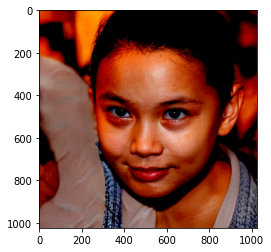

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


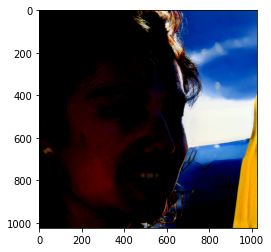

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


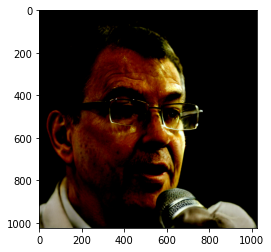

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


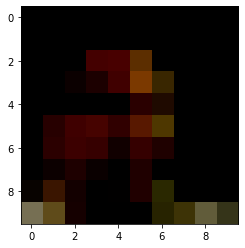

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


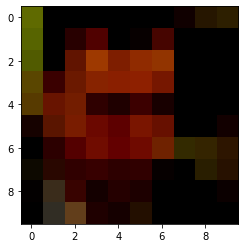

 18%|█▊        | 18/100 [13:25<1:01:14, 44.81s/it]

loss is tensor(691.5190, grad_fn=<NegBackward>)
tensor([[-697.8465, -694.0740, -698.8017]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


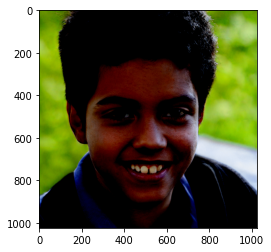

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


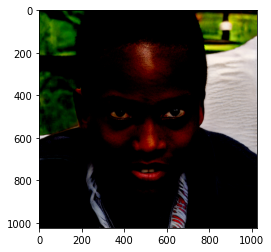

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


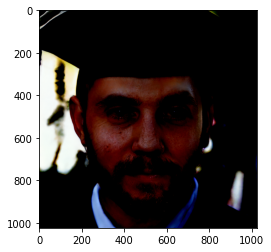

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


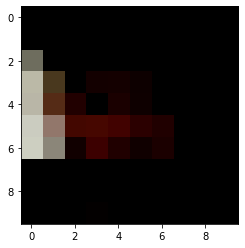

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


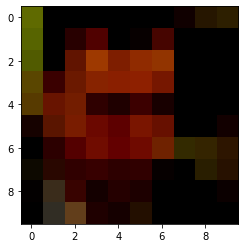

 19%|█▉        | 19/100 [14:10<1:00:38, 44.92s/it]

loss is tensor(670.6565, grad_fn=<NegBackward>)
tensor([[-658.0357, -691.3180, -705.7301]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


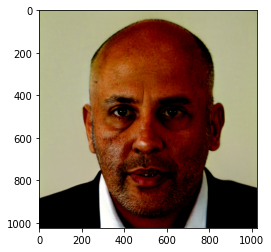

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


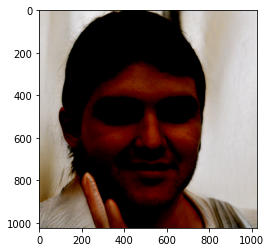

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


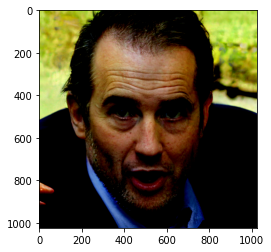

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


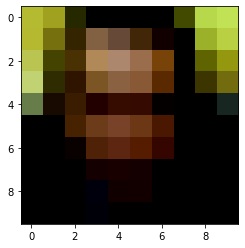

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


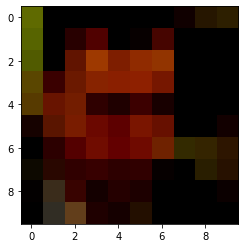

 20%|██        | 20/100 [14:56<1:00:00, 45.01s/it]

loss is tensor(668.2557, grad_fn=<NegBackward>)
tensor([[-673.5375, -714.1376, -693.5875]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


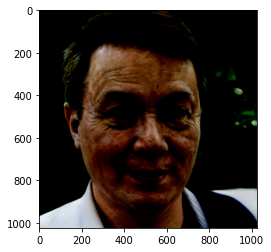

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


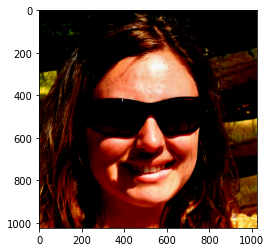

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


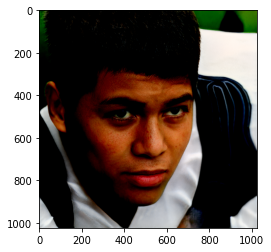

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


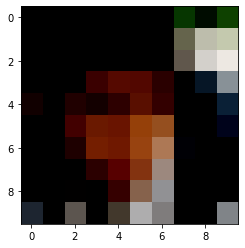

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


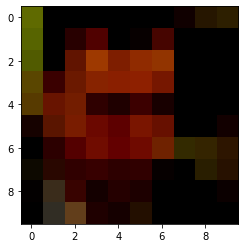

 21%|██        | 21/100 [15:40<58:57, 44.78s/it]  

loss is tensor(661.5303, grad_fn=<NegBackward>)
tensor([[-672.2916, -683.9740, -677.5364]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


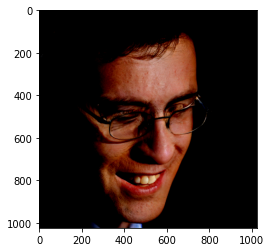

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


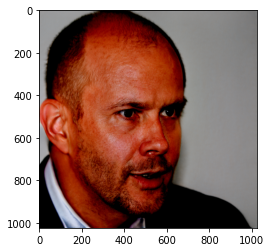

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


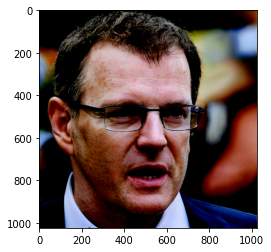

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


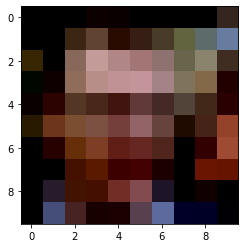

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


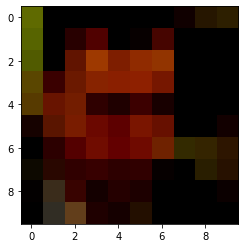

 22%|██▏       | 22/100 [16:25<58:20, 44.88s/it]

loss is tensor(659.7865, grad_fn=<NegBackward>)
tensor([[-688.1028, -703.0870, -671.3990]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


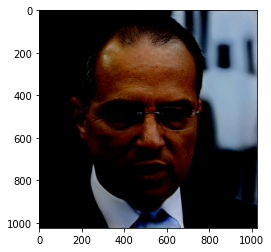

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


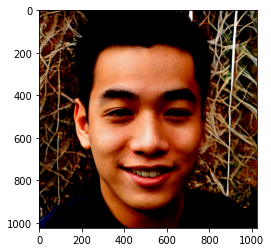

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


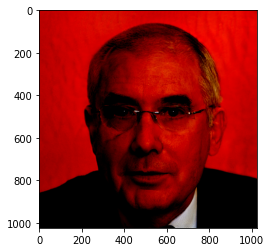

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


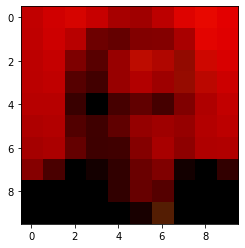

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


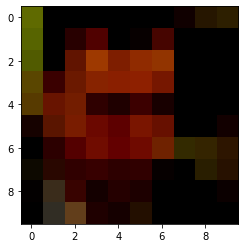

 23%|██▎       | 23/100 [17:09<57:23, 44.73s/it]

loss is tensor(668.9554, grad_fn=<NegBackward>)
tensor([[-677.9174, -679.6769, -705.3512]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


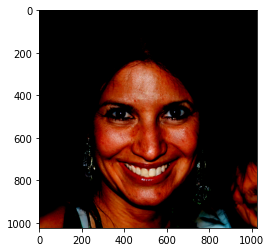

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


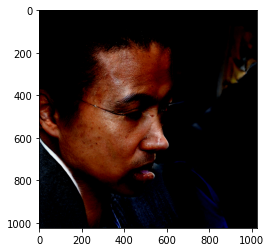

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


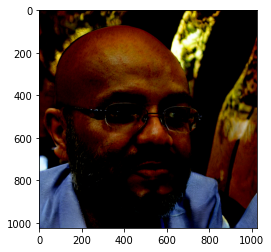

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


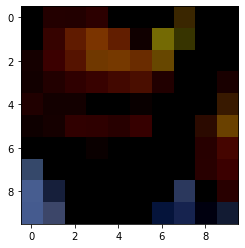

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


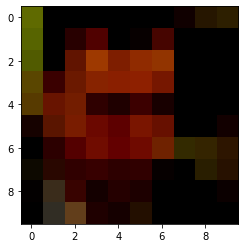

 24%|██▍       | 24/100 [17:54<56:50, 44.88s/it]

loss is tensor(651.5176, grad_fn=<NegBackward>)
tensor([[-663.3706, -687.8856, -692.9233]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


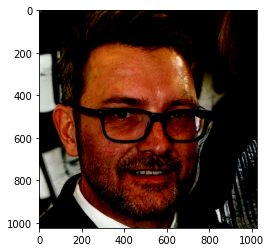

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


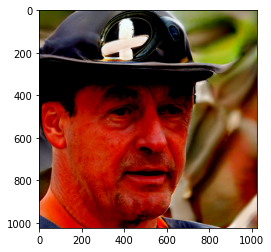

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


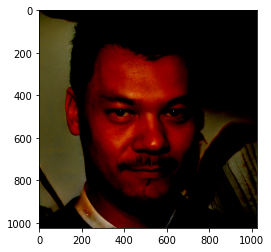

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


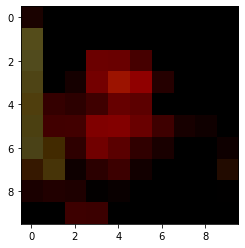

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


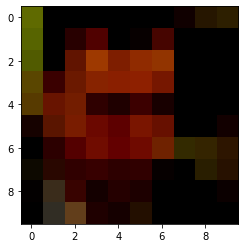

 25%|██▌       | 25/100 [18:39<55:52, 44.70s/it]

loss is tensor(647.6497, grad_fn=<NegBackward>)
tensor([[-681.1892, -689.6794, -675.4787]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


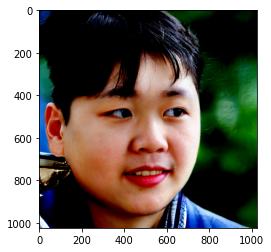

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


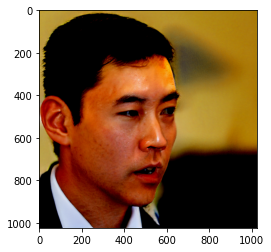

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


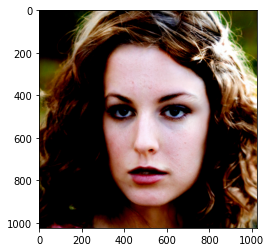

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


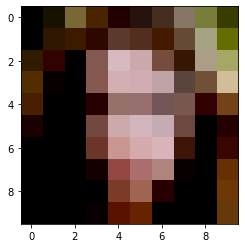

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


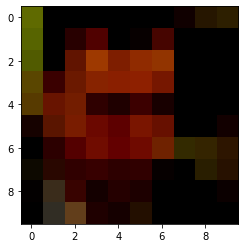

 26%|██▌       | 26/100 [19:24<55:13, 44.77s/it]

loss is tensor(648.3205, grad_fn=<NegBackward>)
tensor([[-636.1855, -664.1953, -665.5190]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


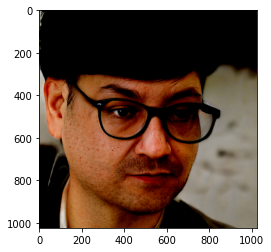

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


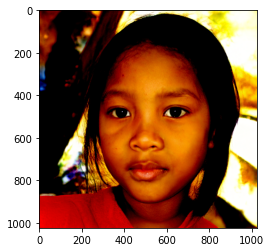

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


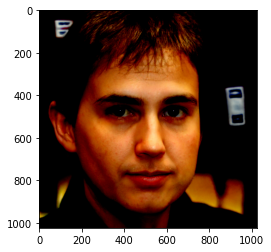

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


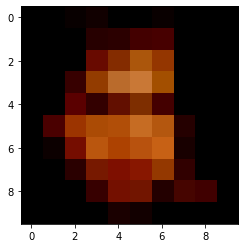

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


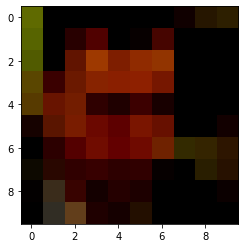

 27%|██▋       | 27/100 [20:08<54:22, 44.69s/it]

loss is tensor(643.7108, grad_fn=<NegBackward>)
tensor([[-677.8157, -655.7034, -656.7686]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


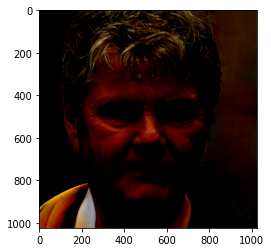

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


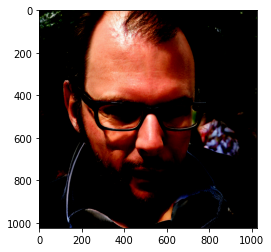

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


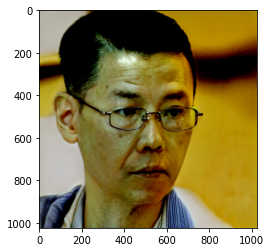

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


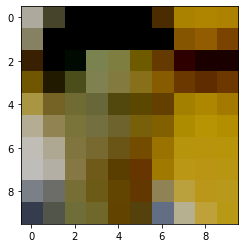

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


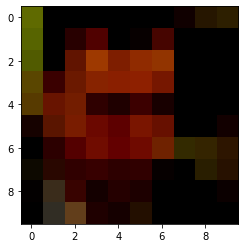

 28%|██▊       | 28/100 [20:50<52:43, 43.94s/it]

loss is tensor(635.2470, grad_fn=<NegBackward>)
tensor([[-705.4632, -668.9714, -663.7354]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


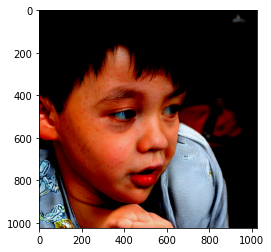

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


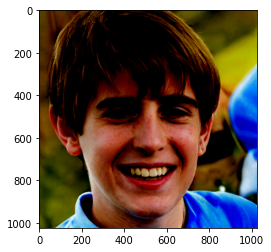

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


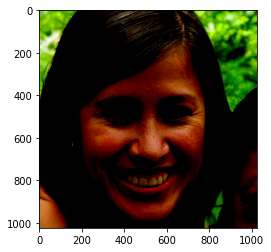

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


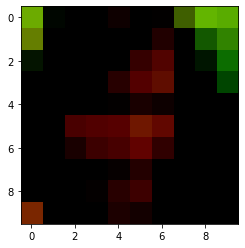

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


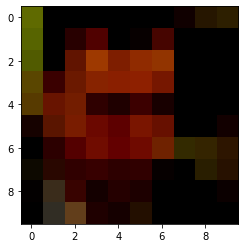

 29%|██▉       | 29/100 [21:35<52:15, 44.17s/it]

loss is tensor(622.8312, grad_fn=<NegBackward>)
tensor([[-672.4847, -635.1862, -653.5675]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


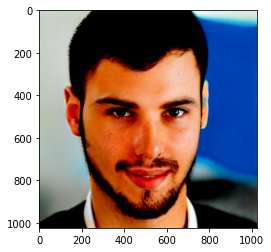

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


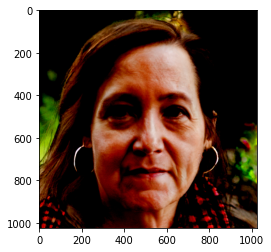

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


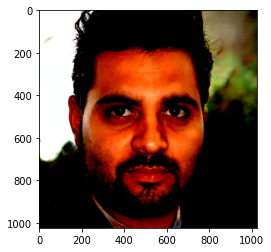

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


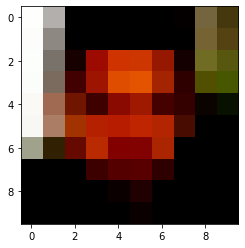

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


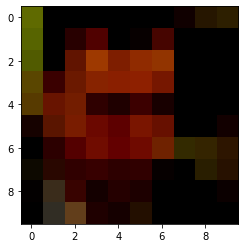

 30%|███       | 30/100 [22:19<51:19, 43.99s/it]

loss is tensor(630.9011, grad_fn=<NegBackward>)
tensor([[-673.7111, -626.7763, -655.9838]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


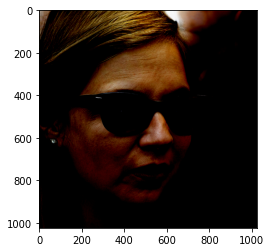

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


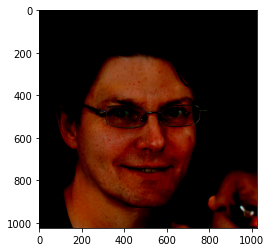

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


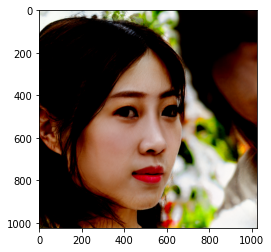

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


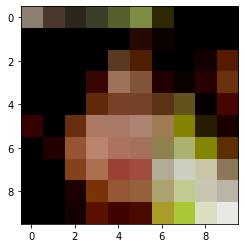

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


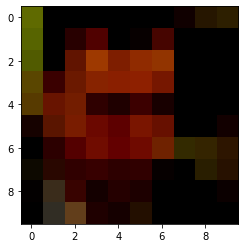

 31%|███       | 31/100 [23:04<51:06, 44.44s/it]

loss is tensor(604.5847, grad_fn=<NegBackward>)
tensor([[-653.7010, -651.1650, -620.9933]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


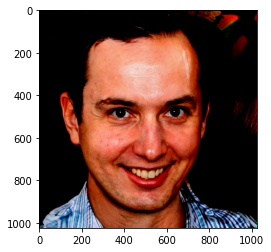

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


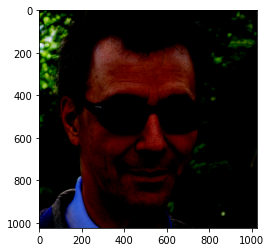

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


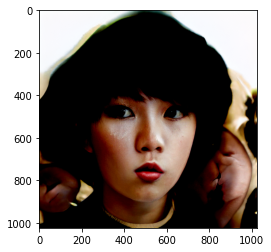

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


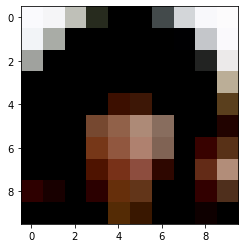

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


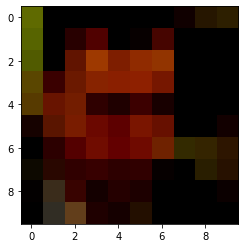

 32%|███▏      | 32/100 [23:49<50:32, 44.59s/it]

loss is tensor(603.8104, grad_fn=<NegBackward>)
tensor([[-638.6593, -694.0947, -618.9670]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


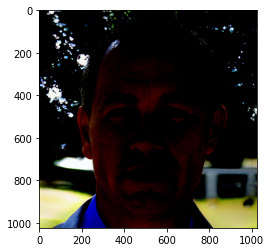

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


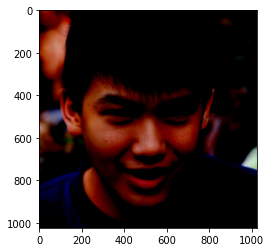

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


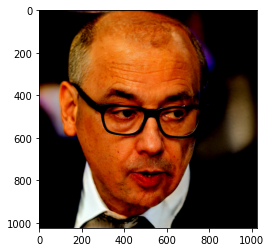

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


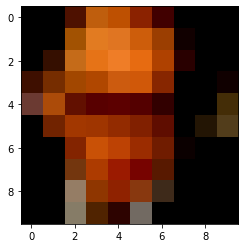

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


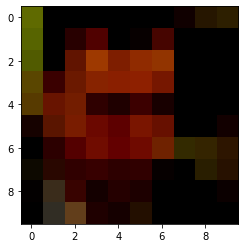

 33%|███▎      | 33/100 [24:34<49:52, 44.67s/it]

loss is tensor(577.5094, grad_fn=<NegBackward>)
tensor([[-663.9865, -661.0459, -678.6413]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


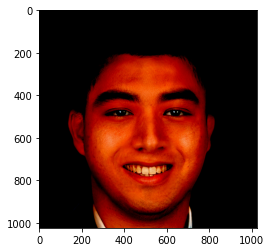

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


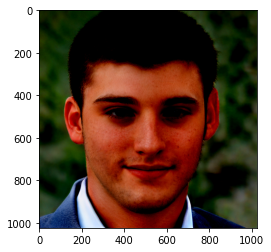

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


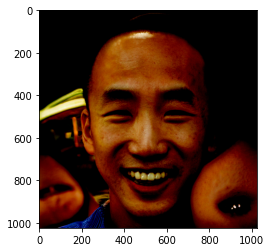

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


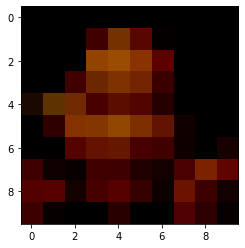

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


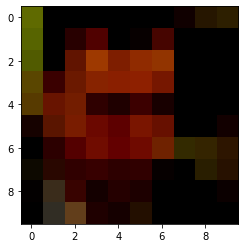

 34%|███▍      | 34/100 [25:19<49:17, 44.82s/it]

loss is tensor(592.5222, grad_fn=<NegBackward>)
tensor([[-643.9156, -605.4100, -604.0631]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


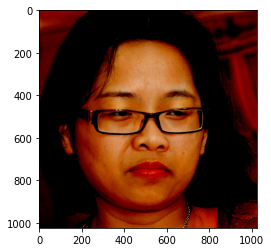

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


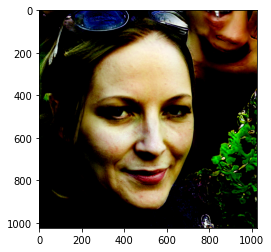

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


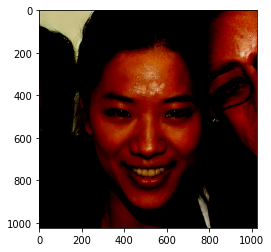

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


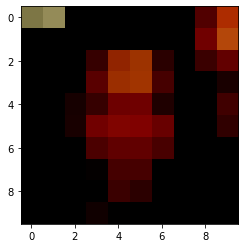

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


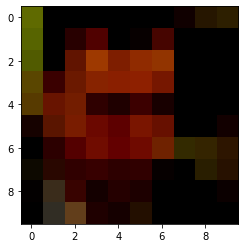

 35%|███▌      | 35/100 [26:04<48:32, 44.81s/it]

loss is tensor(580.0444, grad_fn=<NegBackward>)
tensor([[-632.7833, -658.6824, -610.0233]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


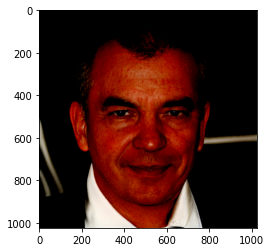

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


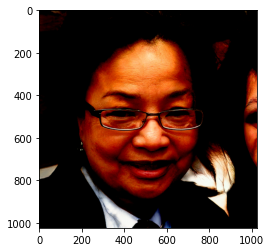

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


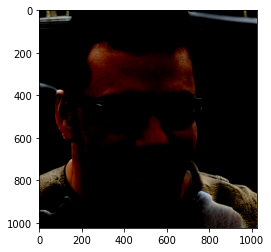

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


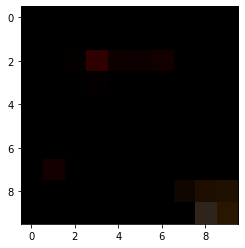

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


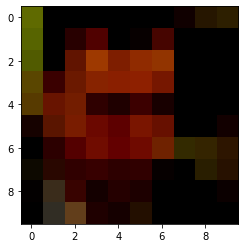

 36%|███▌      | 36/100 [26:49<47:54, 44.92s/it]

loss is tensor(575.6152, grad_fn=<NegBackward>)
tensor([[-623.3245, -598.3234, -665.5577]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


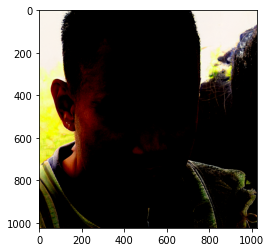

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


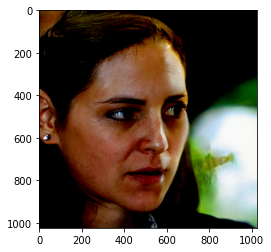

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


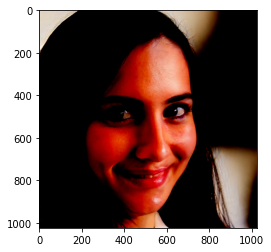

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


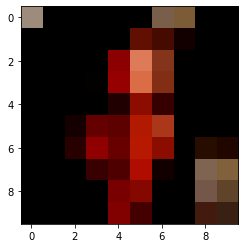

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


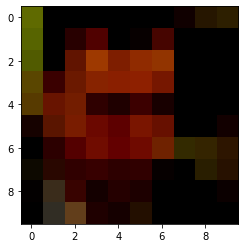

 37%|███▋      | 37/100 [27:34<47:02, 44.81s/it]

loss is tensor(567.2362, grad_fn=<NegBackward>)
tensor([[-591.5714, -633.7688, -665.2932]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


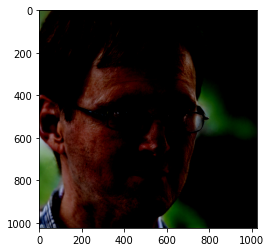

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


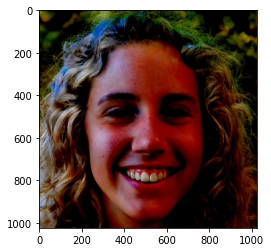

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


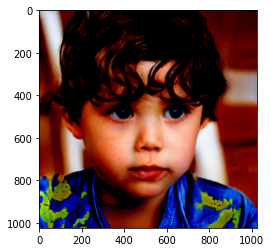

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


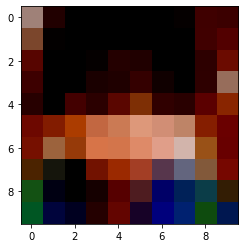

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


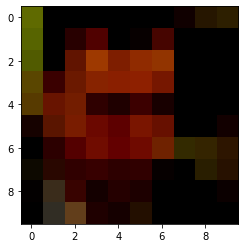

 38%|███▊      | 38/100 [28:19<46:27, 44.95s/it]

loss is tensor(580.2529, grad_fn=<NegBackward>)
tensor([[-623.3054, -629.3364, -646.5517]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


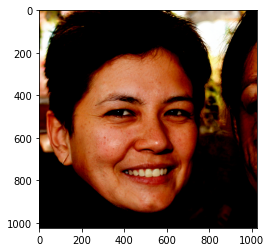

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


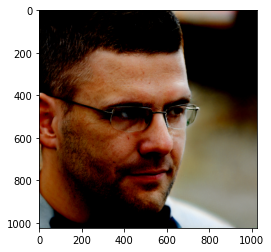

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


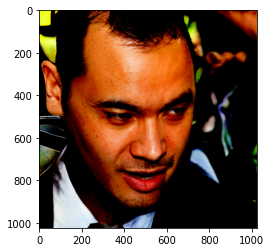

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


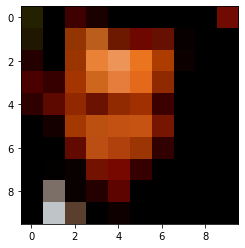

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


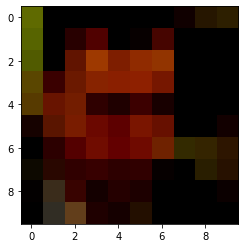

 39%|███▉      | 39/100 [29:05<45:53, 45.14s/it]

loss is tensor(541.3306, grad_fn=<NegBackward>)
tensor([[-603.9558, -605.5088, -607.8280]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


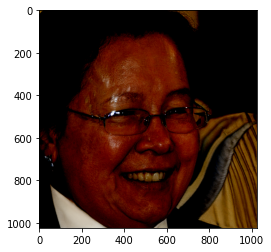

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


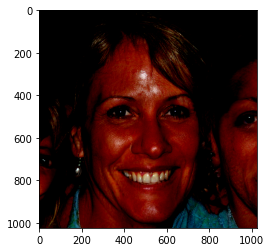

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


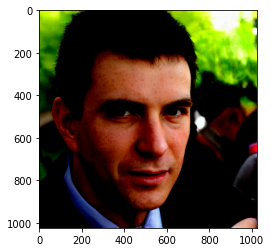

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


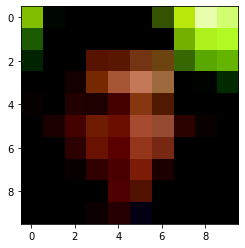

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


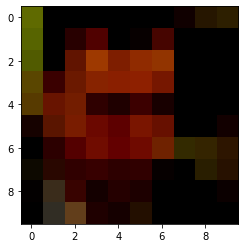

 40%|████      | 40/100 [29:51<45:25, 45.42s/it]

loss is tensor(548.3748, grad_fn=<NegBackward>)
tensor([[-633.2407, -560.2514, -634.0640]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


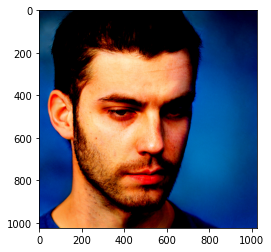

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


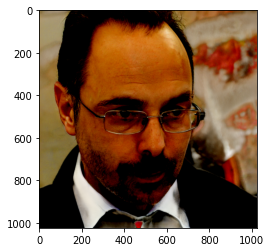

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


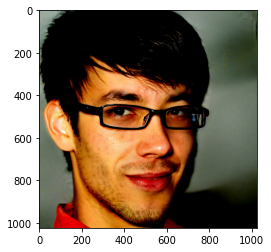

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


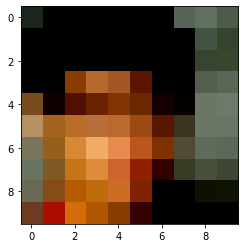

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


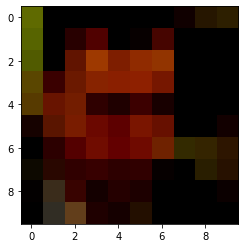

 41%|████      | 41/100 [30:36<44:46, 45.54s/it]

loss is tensor(558.4746, grad_fn=<NegBackward>)
tensor([[-550.7357, -592.9506, -578.7460]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


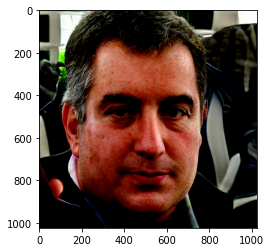

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


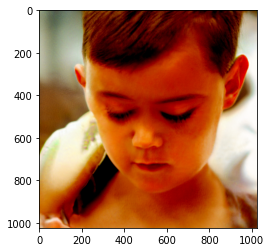

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


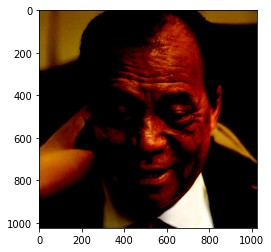

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


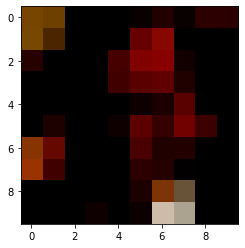

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


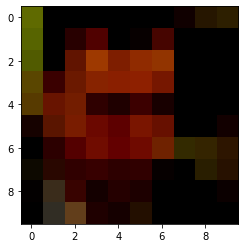

 42%|████▏     | 42/100 [31:23<44:15, 45.78s/it]

loss is tensor(530.2806, grad_fn=<NegBackward>)
tensor([[-582.3597, -606.0378, -595.6819]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


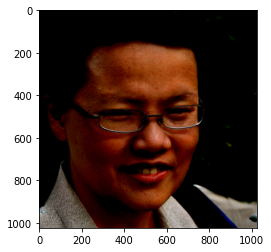

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


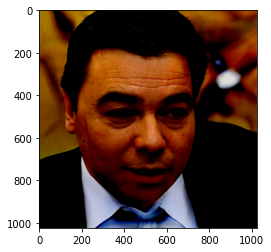

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


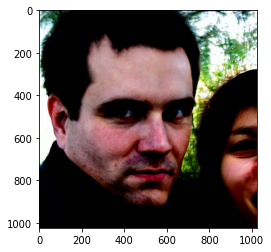

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


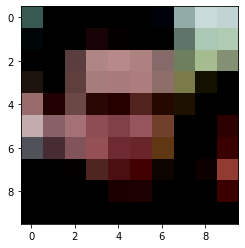

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


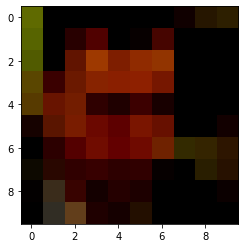

 43%|████▎     | 43/100 [32:08<43:16, 45.55s/it]

loss is tensor(551.7219, grad_fn=<NegBackward>)
tensor([[-594.6531, -603.5095, -562.6418]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


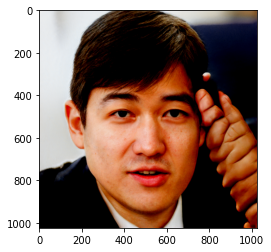

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


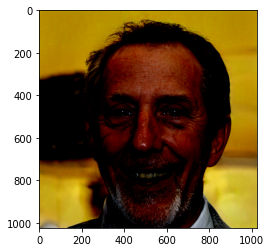

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


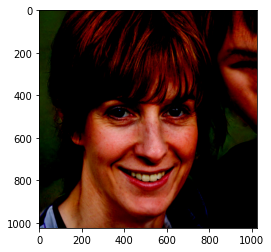

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


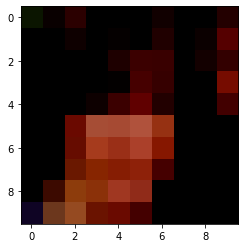

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


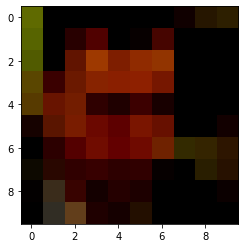

 44%|████▍     | 44/100 [32:54<42:40, 45.71s/it]

loss is tensor(531.1737, grad_fn=<NegBackward>)
tensor([[-573.4023, -552.4331, -618.0907]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


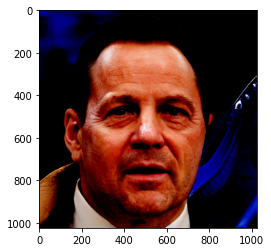

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


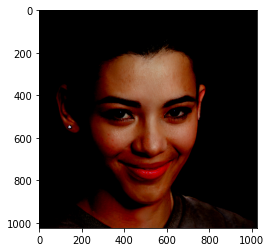

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


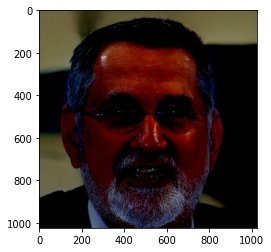

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


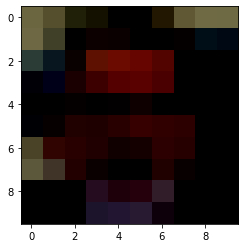

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


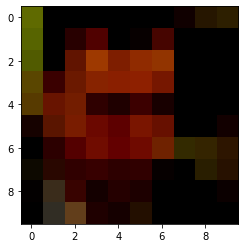

 45%|████▌     | 45/100 [33:39<41:49, 45.63s/it]

loss is tensor(532.7798, grad_fn=<NegBackward>)
tensor([[-564.3226, -600.0541, -569.9224]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


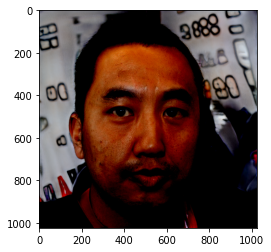

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


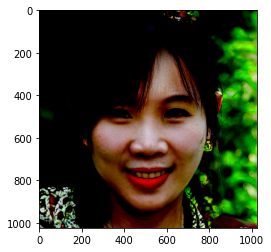

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


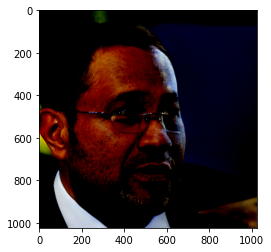

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


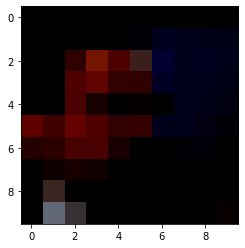

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


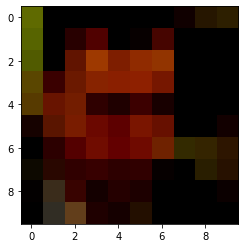

 46%|████▌     | 46/100 [34:25<41:10, 45.75s/it]

loss is tensor(535.2130, grad_fn=<NegBackward>)
tensor([[-568.1815, -545.8727, -583.0939]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


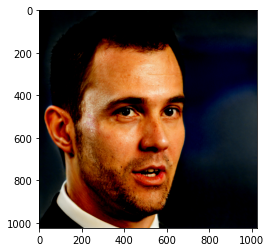

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


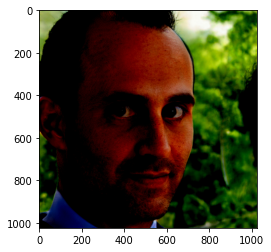

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


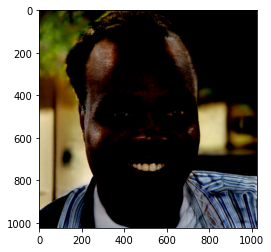

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


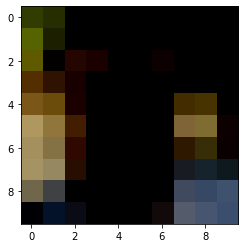

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


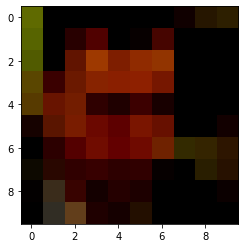

 47%|████▋     | 47/100 [35:10<40:12, 45.52s/it]

loss is tensor(524.2626, grad_fn=<NegBackward>)
tensor([[-584.0410, -589.0740, -644.5110]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


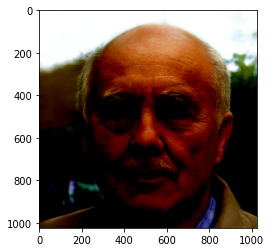

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


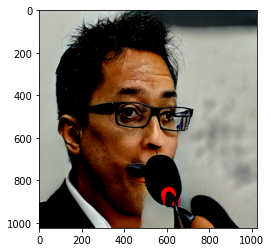

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


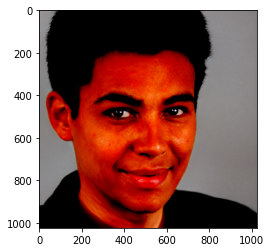

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


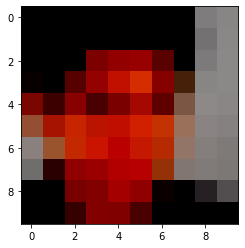

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


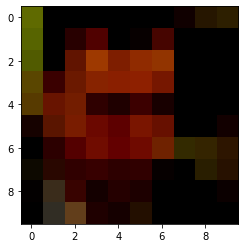

 48%|████▊     | 48/100 [35:56<39:29, 45.57s/it]

loss is tensor(528.3577, grad_fn=<NegBackward>)
tensor([[-588.9607, -548.9238, -586.2932]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


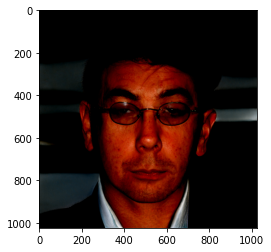

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


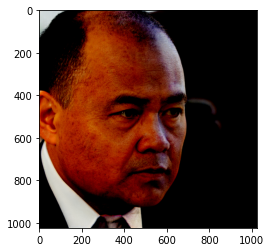

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


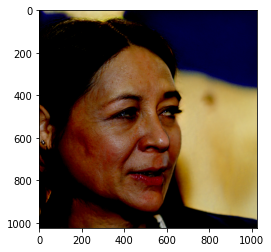

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


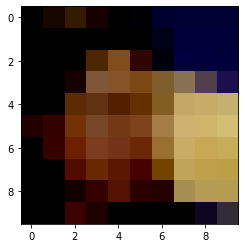

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


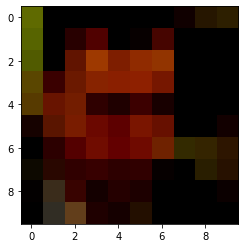

 49%|████▉     | 49/100 [36:41<38:35, 45.39s/it]

loss is tensor(498.0796, grad_fn=<NegBackward>)
tensor([[-579.1886, -588.0597, -545.0758]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


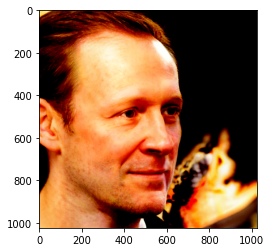

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


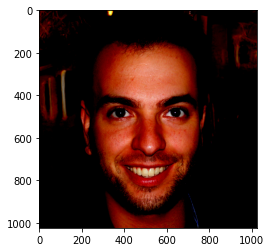

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


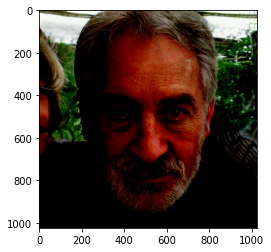

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


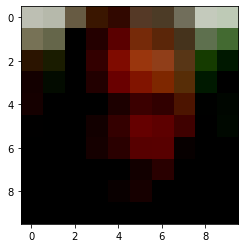

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


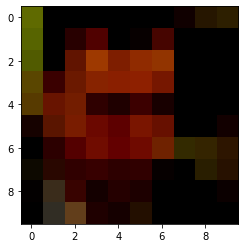

 50%|█████     | 50/100 [37:27<38:00, 45.61s/it]

loss is tensor(483.9061, grad_fn=<NegBackward>)
tensor([[-584.3538, -543.9387, -539.3904]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


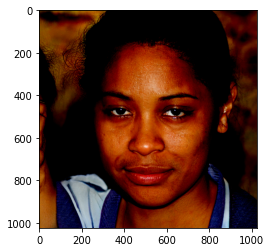

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


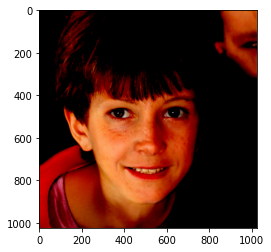

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


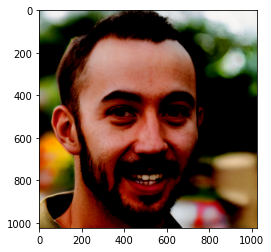

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


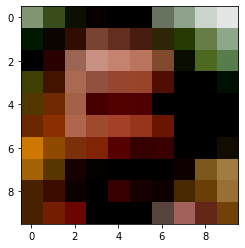

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


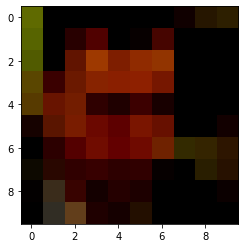

 51%|█████     | 51/100 [38:13<37:16, 45.65s/it]

loss is tensor(541.1177, grad_fn=<NegBackward>)
tensor([[-599.3957, -565.9794, -567.6824]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


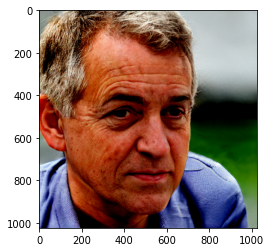

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


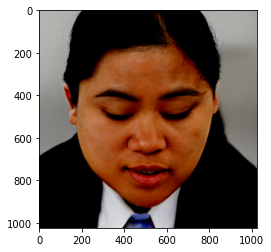

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


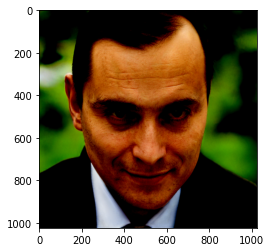

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


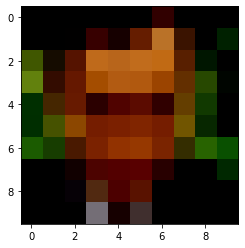

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


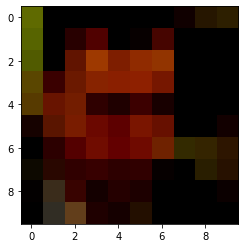

 52%|█████▏    | 52/100 [38:59<36:42, 45.88s/it]

loss is tensor(510.6933, grad_fn=<NegBackward>)
tensor([[-599.3597, -612.0444, -561.7303]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


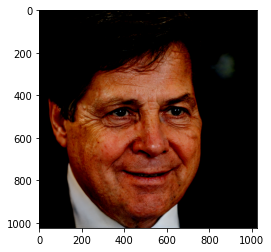

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


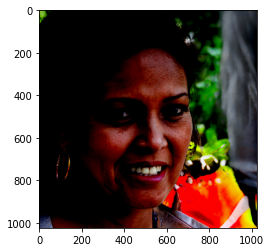

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


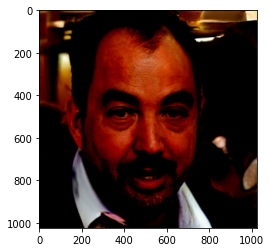

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


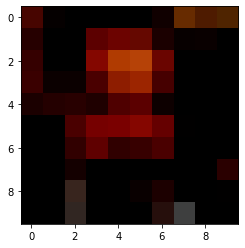

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


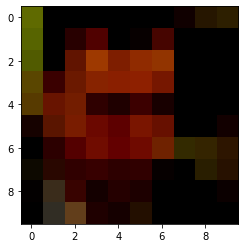

 53%|█████▎    | 53/100 [39:45<35:54, 45.83s/it]

loss is tensor(481.6428, grad_fn=<NegBackward>)
tensor([[-574.4724, -584.6899, -547.2148]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


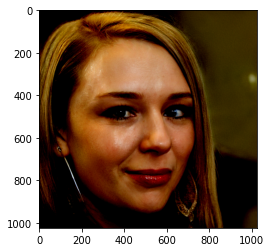

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


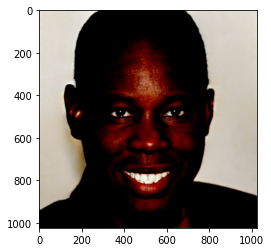

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


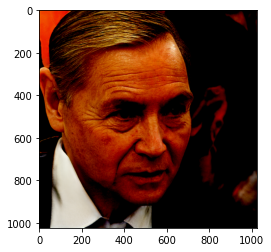

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


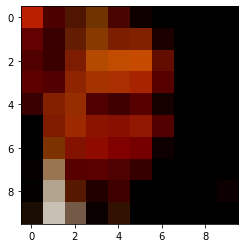

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


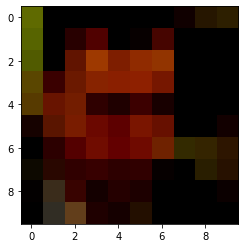

 54%|█████▍    | 54/100 [40:31<35:12, 45.93s/it]

loss is tensor(499.1298, grad_fn=<NegBackward>)
tensor([[-558.6366, -551.2480, -577.6772]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


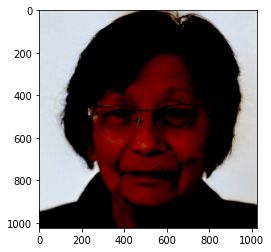

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


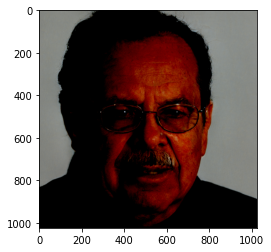

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


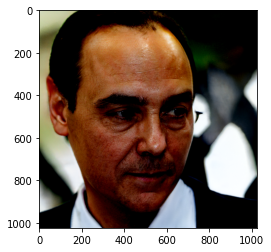

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


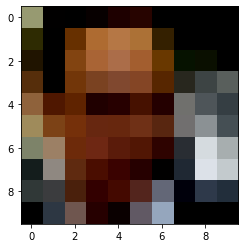

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


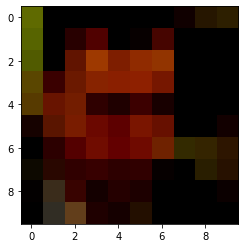

 55%|█████▌    | 55/100 [41:16<34:14, 45.65s/it]

loss is tensor(520.4899, grad_fn=<NegBackward>)
tensor([[-555.2936, -546.5361, -556.3234]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


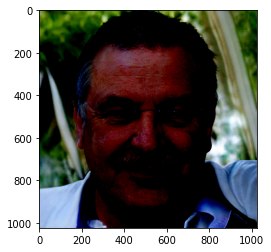

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


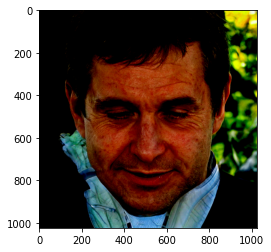

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


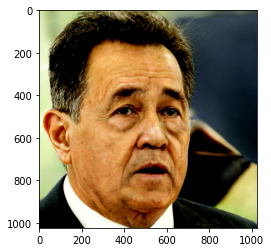

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


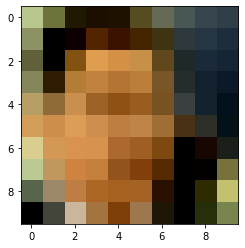

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


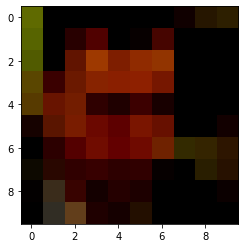

 56%|█████▌    | 56/100 [42:02<33:28, 45.65s/it]

loss is tensor(533.0220, grad_fn=<NegBackward>)
tensor([[-573.0559, -577.9816, -565.7542]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


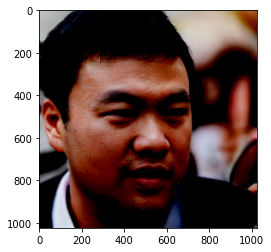

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


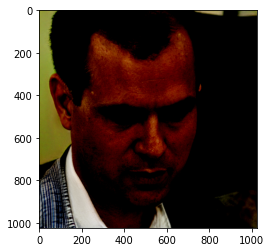

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


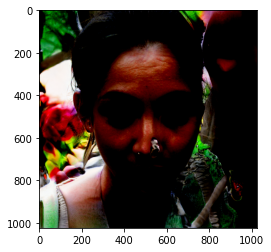

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


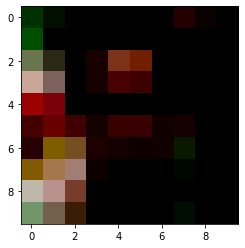

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


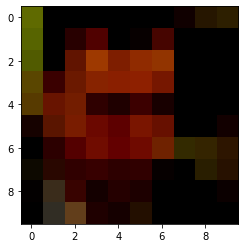

 57%|█████▋    | 57/100 [42:47<32:41, 45.62s/it]

loss is tensor(497.2940, grad_fn=<NegBackward>)
tensor([[-526.0388, -564.1032, -527.8392]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


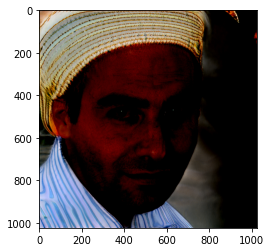

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


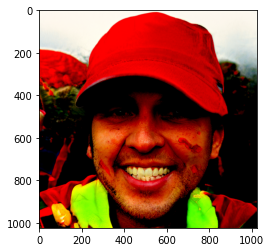

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


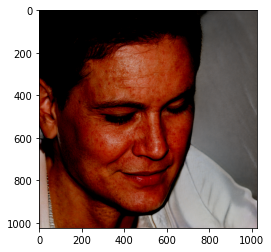

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


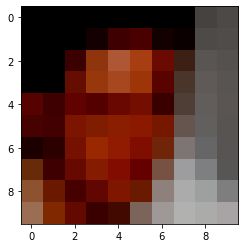

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


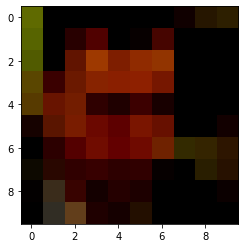

 58%|█████▊    | 58/100 [43:33<32:01, 45.75s/it]

loss is tensor(472.0744, grad_fn=<NegBackward>)
tensor([[-553.3806, -559.2961, -580.0842]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


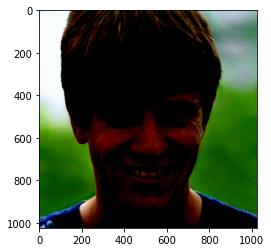

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


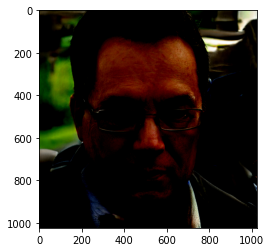

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


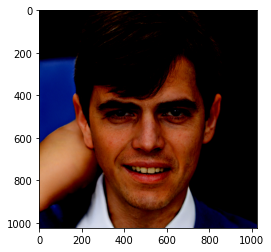

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


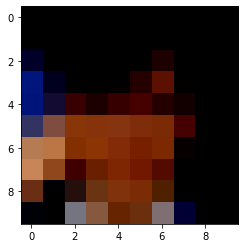

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


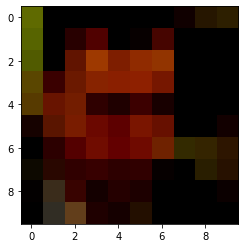

 59%|█████▉    | 59/100 [44:17<30:51, 45.16s/it]

loss is tensor(509.8549, grad_fn=<NegBackward>)
tensor([[-535.3394, -567.2963, -557.5159]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


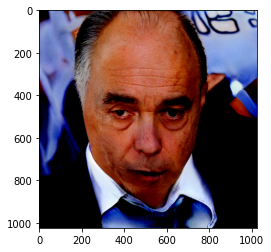

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


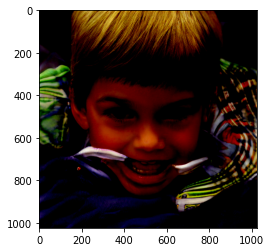

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


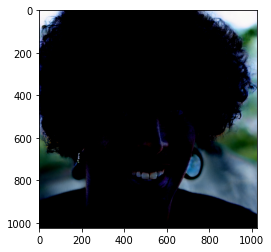

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


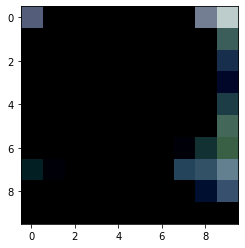

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


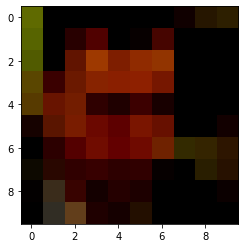

 60%|██████    | 60/100 [45:04<30:23, 45.58s/it]

loss is tensor(481.8823, grad_fn=<NegBackward>)
tensor([[-563.8610, -549.0062, -531.5272]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


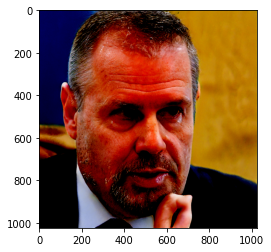

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


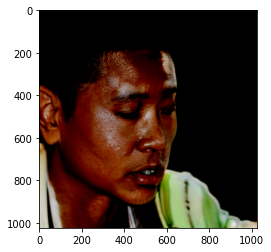

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


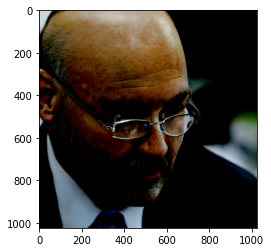

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


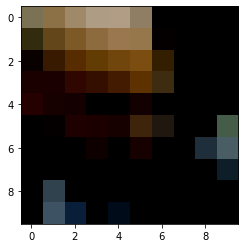

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


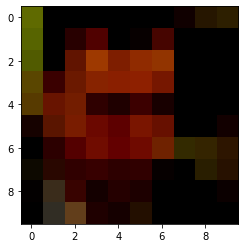

 61%|██████    | 61/100 [45:49<29:34, 45.49s/it]

loss is tensor(513.4728, grad_fn=<NegBackward>)
tensor([[-557.8916, -532.0667, -568.8749]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


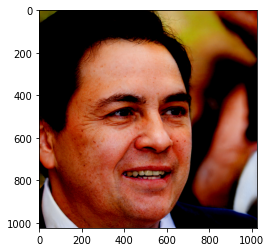

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


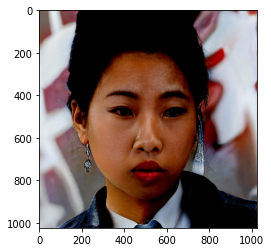

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


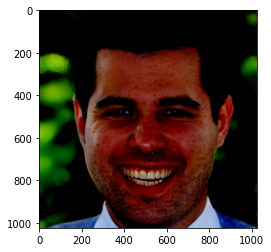

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


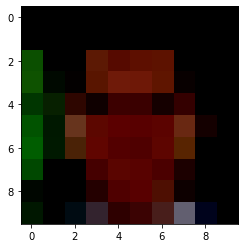

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


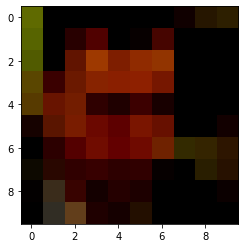

 62%|██████▏   | 62/100 [46:35<28:54, 45.63s/it]

loss is tensor(477.0461, grad_fn=<NegBackward>)
tensor([[-559.3809, -552.4426, -525.4710]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


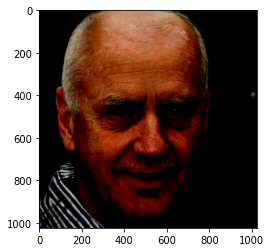

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


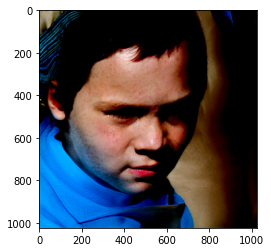

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


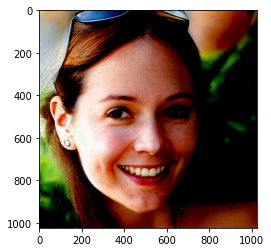

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


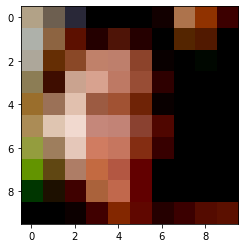

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


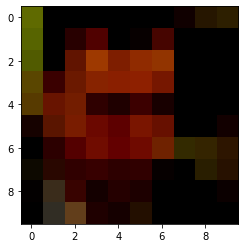

 63%|██████▎   | 63/100 [47:21<28:08, 45.63s/it]

loss is tensor(447.3005, grad_fn=<NegBackward>)
tensor([[-550.1735, -573.3426, -568.0087]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


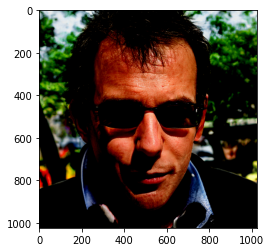

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


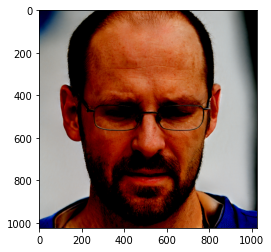

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


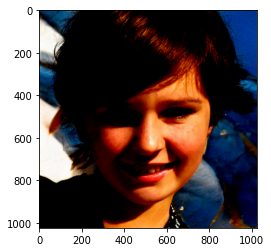

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


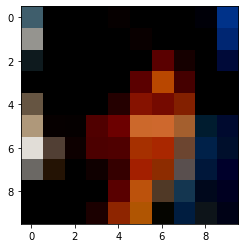

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


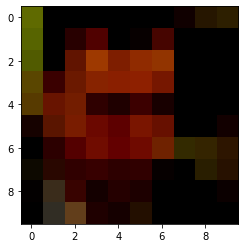

 64%|██████▍   | 64/100 [48:06<27:24, 45.68s/it]

loss is tensor(483.1589, grad_fn=<NegBackward>)
tensor([[-562.9187, -526.1262, -545.3262]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


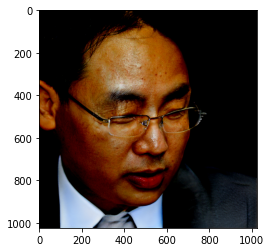

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


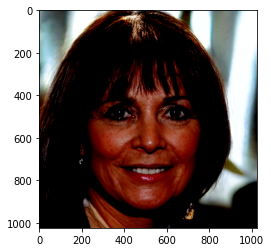

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


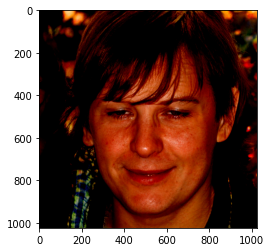

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


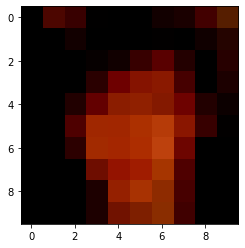

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


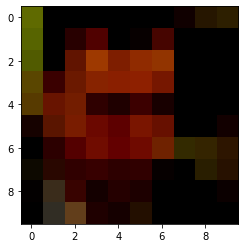

 65%|██████▌   | 65/100 [48:52<26:36, 45.61s/it]

loss is tensor(497.3885, grad_fn=<NegBackward>)
tensor([[-561.7150, -530.9941, -530.0054]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


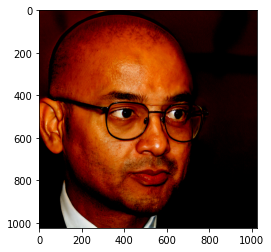

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


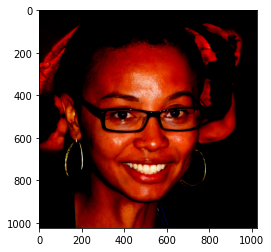

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


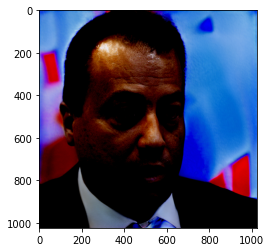

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


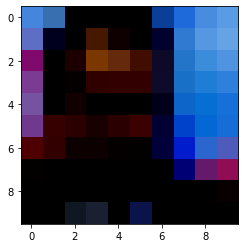

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


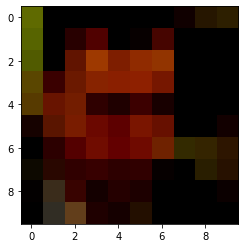

 66%|██████▌   | 66/100 [49:38<25:57, 45.80s/it]

loss is tensor(477.1526, grad_fn=<NegBackward>)
tensor([[-529.3652, -566.1156, -561.7828]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


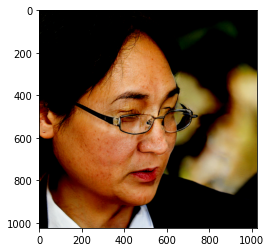

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


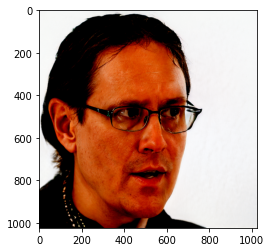

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


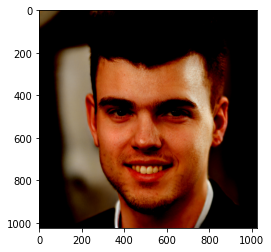

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


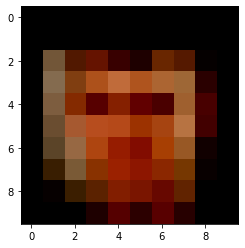

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


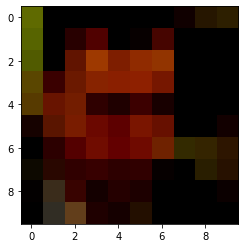

 67%|██████▋   | 67/100 [50:24<25:09, 45.75s/it]

loss is tensor(477.0665, grad_fn=<NegBackward>)
tensor([[-567.5927, -569.4456, -605.8783]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


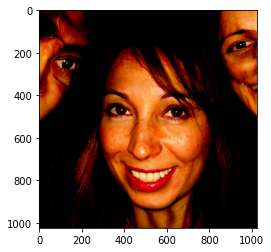

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


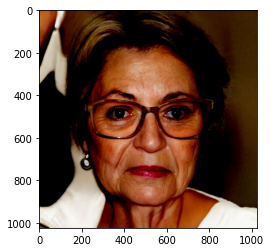

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


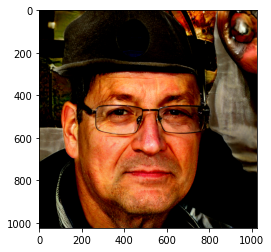

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


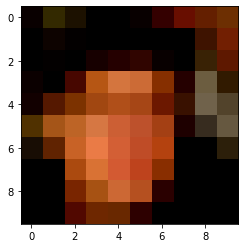

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


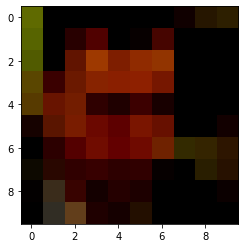

 68%|██████▊   | 68/100 [51:09<24:23, 45.75s/it]

loss is tensor(472.7640, grad_fn=<NegBackward>)
tensor([[-542.8595, -565.0249, -500.8449]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


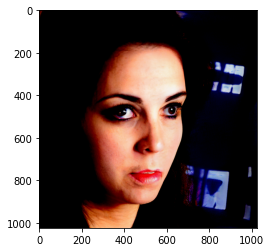

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


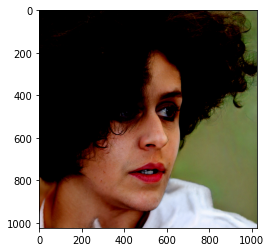

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


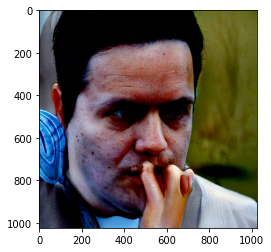

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


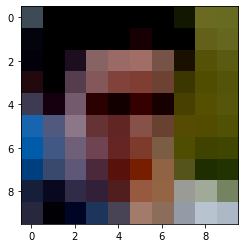

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


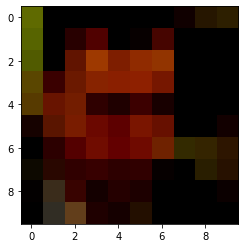

 69%|██████▉   | 69/100 [51:55<23:34, 45.63s/it]

loss is tensor(463.8046, grad_fn=<NegBackward>)
tensor([[-540.1527, -545.0430, -528.5118]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


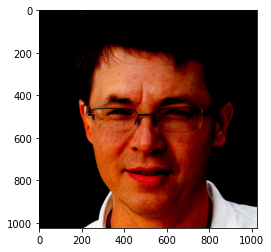

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


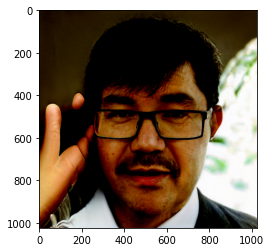

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


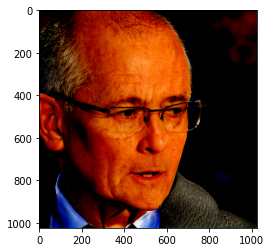

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


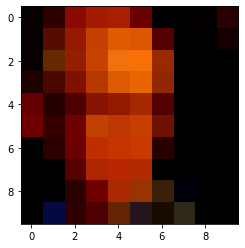

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


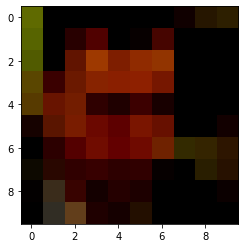

 70%|███████   | 70/100 [52:41<22:49, 45.67s/it]

loss is tensor(476.2098, grad_fn=<NegBackward>)
tensor([[-529.0618, -538.6861, -498.7311]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


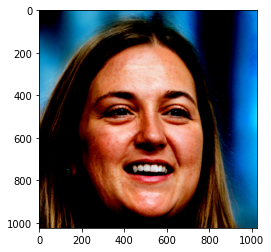

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


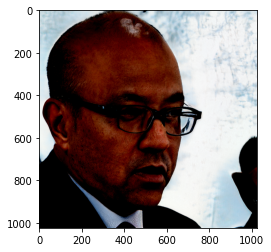

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


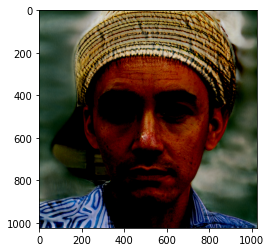

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


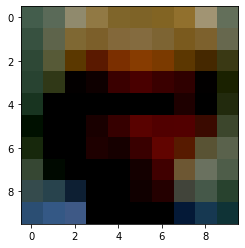

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


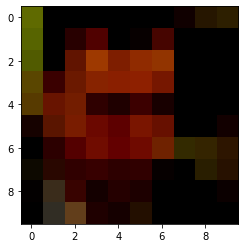

 71%|███████   | 71/100 [53:26<21:59, 45.50s/it]

loss is tensor(451.1818, grad_fn=<NegBackward>)
tensor([[-568.7354, -562.0850, -501.9941]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


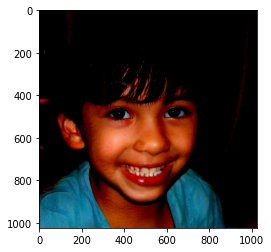

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


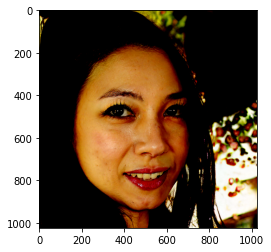

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


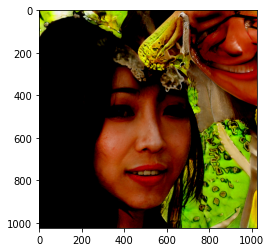

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


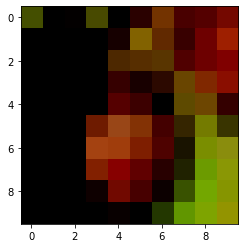

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


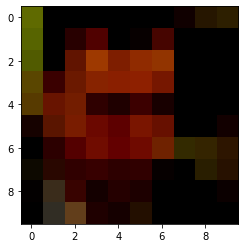

 72%|███████▏  | 72/100 [54:12<21:16, 45.61s/it]

loss is tensor(455.8163, grad_fn=<NegBackward>)
tensor([[-548.9848, -542.7775, -502.9962]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


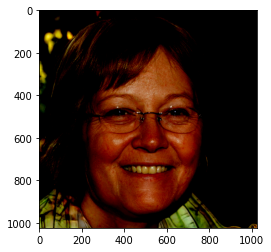

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


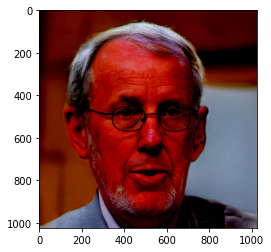

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


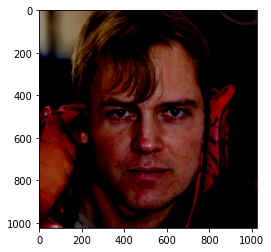

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


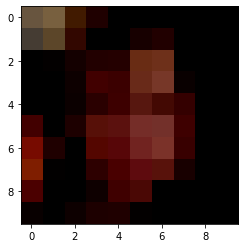

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


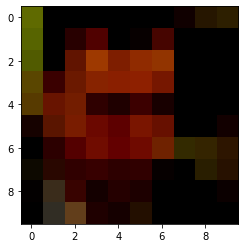

 73%|███████▎  | 73/100 [54:57<20:29, 45.54s/it]

loss is tensor(473.1451, grad_fn=<NegBackward>)
tensor([[-518.0612, -534.3232, -527.9727]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


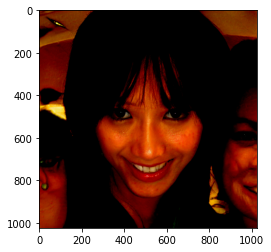

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


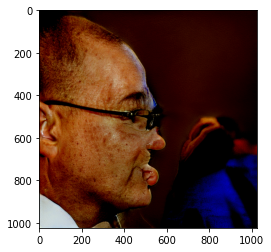

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


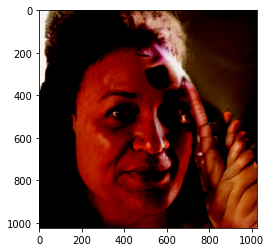

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


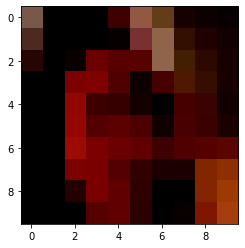

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


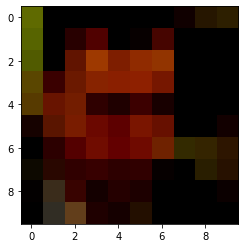

 74%|███████▍  | 74/100 [55:43<19:45, 45.61s/it]

loss is tensor(452.6537, grad_fn=<NegBackward>)
tensor([[-549.4924, -508.2390, -493.7951]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


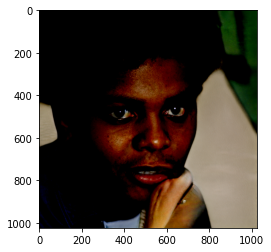

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


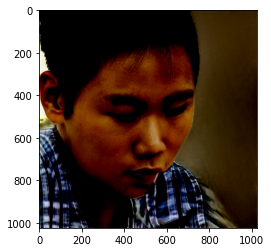

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


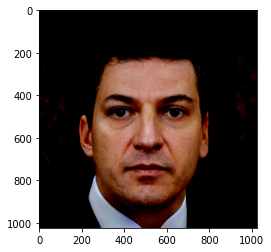

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


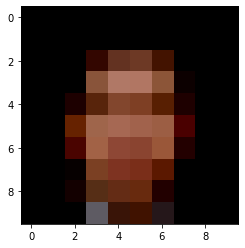

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


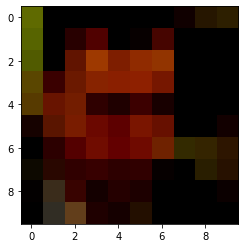

 75%|███████▌  | 75/100 [56:28<18:57, 45.52s/it]

loss is tensor(466.9961, grad_fn=<NegBackward>)
tensor([[-500.8103, -555.1244, -529.1260]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


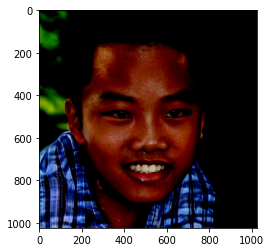

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


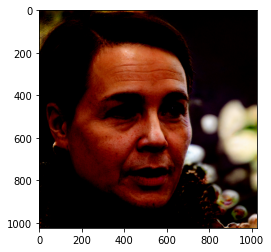

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


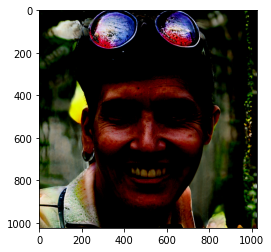

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


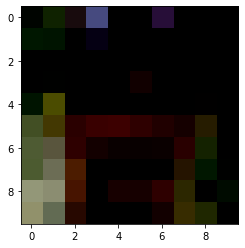

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


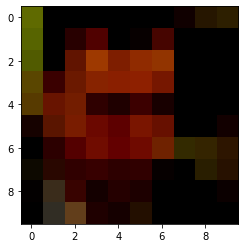

 76%|███████▌  | 76/100 [57:14<18:12, 45.51s/it]

loss is tensor(487.2662, grad_fn=<NegBackward>)
tensor([[-524.4983, -555.8201, -497.4597]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


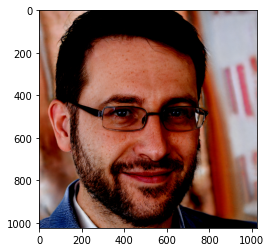

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


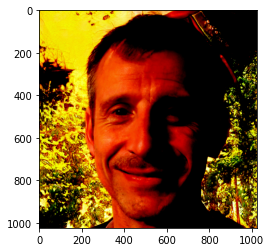

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


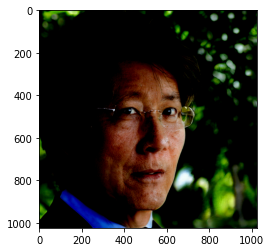

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


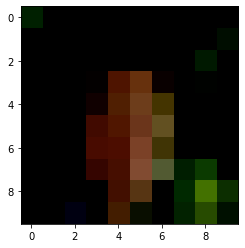

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


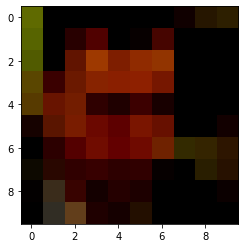

 77%|███████▋  | 77/100 [57:59<17:24, 45.42s/it]

loss is tensor(456.2213, grad_fn=<NegBackward>)
tensor([[-533.4645, -512.6384, -502.0123]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


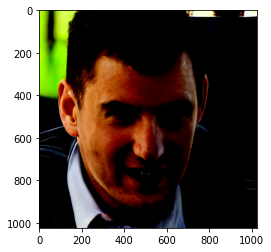

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


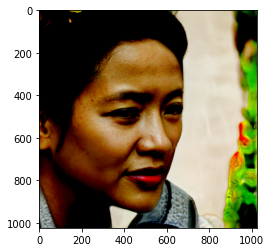

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


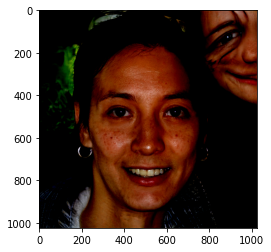

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


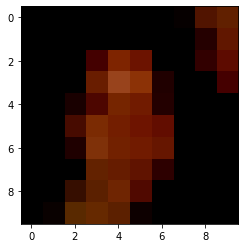

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


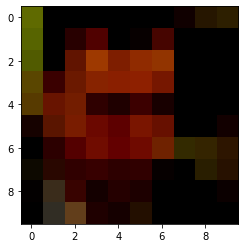

 78%|███████▊  | 78/100 [58:44<16:40, 45.50s/it]

loss is tensor(458.5290, grad_fn=<NegBackward>)
tensor([[-510.9931, -535.8481, -530.3784]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


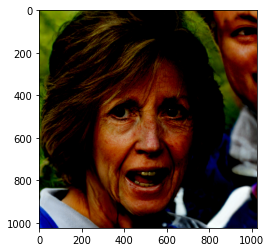

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


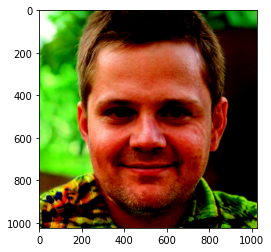

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


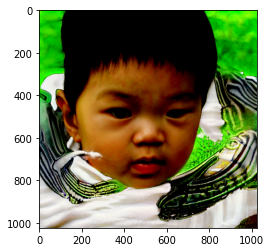

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


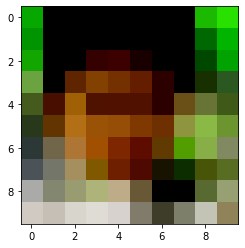

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


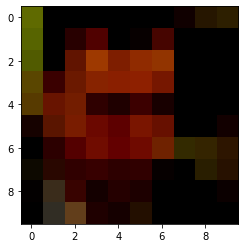

 79%|███████▉  | 79/100 [59:30<15:54, 45.45s/it]

loss is tensor(454.5303, grad_fn=<NegBackward>)
tensor([[-551.0345, -509.0587, -528.2569]], grad_fn=<SubBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


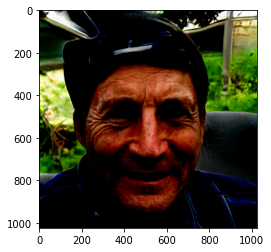

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


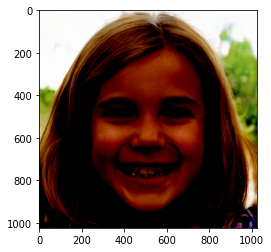

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


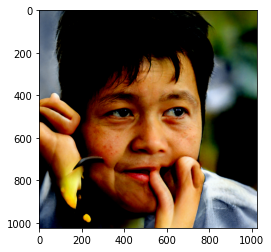

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


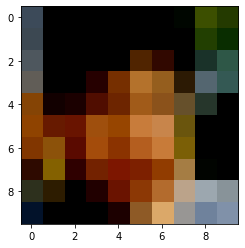

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


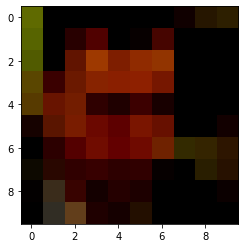

 80%|████████  | 80/100 [1:00:15<15:09, 45.45s/it]

loss is tensor(463.2803, grad_fn=<NegBackward>)


In [ ]:
def plot_outputs(features, z_in, probs):
    print(probs)
    w = generator.mapping_network(np.reshape(z_in[0][0].detach(), [1,512]), training=False)
    out_image1 = generator.synthesis_network(w, training=False)

    w = generator.mapping_network(np.reshape(z_in[0][1].detach(), [1,512]), training=False)
    out_image2 = generator.synthesis_network(w, training=False)
    
    w = generator.mapping_network(np.reshape(z_in[0][2].detach(), [1,512]), training=False)
    out_image3 = generator.synthesis_network(w, training=False)
    
    
    original_image = np.transpose(np.squeeze(out_image1), [1,2,0])
    plt.imshow(original_image)
    plt.show()
    original_image = np.transpose(np.squeeze(out_image2), [1,2,0])
    plt.imshow(original_image)
    plt.show()
    original_image = np.transpose(np.squeeze(out_image3), [1,2,0])
    plt.imshow(original_image)
    plt.show()
    resized_image = resize(original_image, [10, 10, 3])
    plt.imshow(resized_image)
    plt.show()
    plt.imshow(np.transpose(np.reshape(features, [3, 10,10]), [1,2,0]))
    plt.show()
    

from tqdm import tqdm
num_iter = 100
for i in tqdm(range(num_iter)):
    for x, y in train_loader:
        optimizer.zero_grad()
        loss = -flow.log_prob(inputs=x, context=y).mean()
        loss.backward()
        optimizer.step()
    print('loss is', loss)
    output = flow.sample_and_log_prob(3, context=torch.tensor([features[0]]))
    plot_outputs(features[0], output[0], output[1])
        
        
        

In [ ]:
## output = flow.sample_and_log_prob(1, context=torch.tensor([features[0]]))

In [22]:
z_in = np.reshape(output[0].detach(), [-1, 512])

In [20]:
output[1]

tensor([[-767.7479]], grad_fn=<SubBackward0>)